**Imports and Housekeeping**

In [366]:
import psycopg2
import sqlalchemy

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")

%matplotlib inline

import numpy as np
import pandas as pd

from scipy import stats
from scipy.stats import norm

from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures


from pprint import pprint

import warnings
warnings.filterwarnings("ignore")

**Establishing connection to PostgresSQL Server**

In [367]:
from sqlalchemy import create_engine

# Postgres username, password, and database name
POSTGRES_ADDRESS = 'localhost'
POSTGRES_PORT = '5432'
POSTGRES_USERNAME = 'postgres' 
POSTGRES_PASSWORD = 'abcd1234' 
POSTGRES_DBNAME = 'FIFA' 

# A long string that contains the necessary Postgres login information
postgres_str = ('postgresql://{username}:{password}@{ipaddress}:{port}/{dbname}'\
.format(username=POSTGRES_USERNAME,\
password=POSTGRES_PASSWORD,\
ipaddress=POSTGRES_ADDRESS,\
port=POSTGRES_PORT,\
dbname=POSTGRES_DBNAME))

# Create the connection
cnx = create_engine(postgres_str)

In [368]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

**Analyzing young attacking players**

In [369]:
df = pd.read_sql_query('''SELECT
                          split_part(player_positions, ',', 1) as position1,
                          split_part(player_positions, ',', 2) as position2,
                          *
                          from players_20 
                          WHERE split_part(player_positions, ',', 1) in ('ST','LW', 'RW', 'CF') 
                          AND age BETWEEN 18 AND 23;''', cnx)

In [370]:
df.head()

,position1,position2,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,ST,RW,231747.0,https://sofifa.com/player/231747/kylian-mbappe/20/159586,K. Mbappé,Kylian Mbappé,20.0,1998-12-20,178.0,73.0,France,Paris Saint-Germain,89.0,95.0,93500000.0,155000.0,"ST, RW",Right,3.0,4.0,5.0,High/Low,Normal,True,191700000.0,"#Speedster, #Dribbler, #Acrobat",RW,7.0,None,2018-07-01,2022.0,RM,10.0,96.0,84.0,78.0,90.0,39.0,75.0,None,None,None,None,None,None,"Beat Offside Trap, Selfish, Early Crosser, Speed Dribbler (CPU AI Only), Crowd Favourite",78.0,89.0,77.0,82.0,79.0,91.0,79.0,63.0,70.0,90.0,96.0,96.0,92.0,89.0,83.0,83.0,76.0,84.0,76.0,79.0,62.0,38.0,89.0,80.0,70.0,84.0,34.0,34.0,32.0,13.0,5.0,7.0,11.0,6.0,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3
1,LW,,222492.0,https://sofifa.com/player/222492/leroy-sane/20/159586,L. Sané,Leroy Sané,23.0,1996-01-11,183.0,75.0,Germany,Manchester City,86.0,92.0,61000000.0,195000.0,LW,Left,2.0,3.0,4.0,High/Medium,Lean,True,125100000.0,"#Speedster, #Dribbler, #Acrobat",SUB,19.0,None,2016-08-02,2021.0,LW,19.0,95.0,81.0,79.0,86.0,38.0,70.0,None,None,None,None,None,None,"Long Throw-in, Selfish, Early Crosser",83.0,81.0,72.0,80.0,85.0,88.0,83.0,82.0,64.0,85.0,93.0,96.0,86.0,81.0,80.0,87.0,64.0,78.0,70.0,78.0,61.0,34.0,84.0,82.0,71.0,80.0,36.0,32.0,35.0,8.0,12.0,9.0,9.0,14.0,82+2,82+2,82+2,84+2,84+2,84+2,84+2,84+2,83+2,83+2,83+2,83+2,74+2,74+2,74+2,83+2,65+2,59+2,59+2,59+2,65+2,61+2,52+2,52+2,52+2,61+2
2,RW,LW,231443.0,https://sofifa.com/player/231443/ousmane-dembele/20/159586,O. Dembélé,Ousmane Dembélé,22.0,1997-05-15,178.0,67.0,France,FC Barcelona,84.0,90.0,42500000.0,195000.0,"RW, LW",Left,3.0,5.0,5.0,High/Medium,Lean,True,95600000.0,"#Speedster, #Dribbler",SUB,11.0,None,2017-08-28,2022.0,SUB,11.0,93.0,79.0,80.0,87.0,36.0,57.0,None,None,None,None,None,None,"Power Free-Kick, Selfish, Early Crosser, Crowd Favourite",84.0,79.0,43.0,82.0,76.0,89.0,82.0,64.0,76.0,85.0,94.0,93.0,89.0,78.0,83.0,83.0,59.0,69.0,52.0,78.0,54.0,36.0,78.0,78.0,75.0,82.0,42.0,30.0,33.0,6.0,6.0,14.0,10.0,13.0,76+3,76+3,76+3,84+3,82+3,82+3,82+3,84+3,82+3,82+3,82+3,83+3,75+3,75+3,75+3,83+3,64+3,59+3,59+3,59+3,64+3,59+3,47+3,47+3,47+3,59+3
3,ST,,232432.0,https://sofifa.com/player/232432/luka-jovic/20/159586,L. Jović,Luka Jović,21.0,1997-12-23,182.0,85.0,Serbia,Real Madrid,83.0,89.0,36500000.0,155000.0,ST,Right,1.0,5.0,3.0,Medium/Medium,Stocky,True,82100000.0,#Poacher,SUB,18.0,None,2019-07-01,2024.0,None,NaN,77.0,82.0,68.0,81.0,29.0,74.0,None,None,None,None,None,None,"Speed Dribbler (CPU AI Only), Outside Foot Shot",67.0,86.0,79.0,74.0,84.0,81.0,77.0,46.0,58.0,83.0,76.0,77.0,78.0,83.0,77.0,83.0,75.0,76.0,78.0,76.0,62.0,23.0,84.0,70.0,66.0,79.0,25.0,26.0,16.0,8.0,7.0,12.0,9

In [371]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1.416000e+03,1416.000000,1416.000000,1416.000000,1416.000000,1.255000e+03,1412.000000,1412.000000,52.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000
mean,238735.036723,20.711158,180.181497,73.509887,63.113701,74.027542,2.029269e+06,6586.158192,1.023305,2.997175,2.574859,4.165331e+06,25.634561,2021.265581,14.211538,72.052260,60.515537,51.088983,63.454096,28.324859,57.801554,46.935028,62.737994,55.637006,56.322034,52.552260,63.069915,49.944209,41.016243,44.408192,62.505650,71.998588,72.096751,68.670198,57.707627,67.673023,62.591808,63.692797,60.375000,61.008475,55.653249,45.000000,23.266243,60.803672,53.766949,58.849576,56.279661,27.656780,24.793785,23.224576,10.078390,10.205508,10.129237,10.145480,10.266243
std,9924.991380,1.620292,6.353895,6.495764,6.675555,6.019516,5.172741e+06,15468.593251,0.184622,0.600347,0.656614,1.111775e+07,18.060640,1.317012,5.366331,9.588278,6.953234,8.984352,7.995627,7.794198,9.551691,13.181581,7.251065,10.852022,8.899722,9.886355,9.013773,11.620580,11.677608,10.913151,8.225357,10.109506,9.689809,10.561915,8.606061,10.976738,8.733594,10.485911,10.326537,12.798738,8.557465,13.474383,9.466722,8.095343,8.484078,8.116508,8.933332,11.037911,10.135889,9.505311,2.921142,2.907672,2.973541,2.951436,2.958682
min,166539.000000,18.000000,159.000000,54.000000,48.000000,58.000000,0.000000e+00,0.000000,1.000000,1.000000,2.000000,7.300000e+04,2.000000,2019.000000,7.000000,37.000000,41.000000,31.000000,44.000000,15.000000,32.000000,18.000000,38.000000,22.000000,30.000000,29.000000,37.000000,22.000000,20.000000,19.000000,38.000000,36.000000,36.000000,32.000000,31.000000,31.000000,36.000000,32.000000,31.000000,28.000000,30.000000,21.000000,10.000000,40.000000,31.000000,20.000000,35.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,232994.000000,19.000000,176.000000,69.000000,58.750000,70.000000,2.500000e+05,1000.000000,1.000000,3.000000,2.000000,4.435000e+05,14.000000,2020.000000,9.750000,66.000000,56.000000,44.000000,58.000000,22.000000,51.000000,35.000000,58.000000,48.000000,50.000000,45.000000,57.000000,42.000000,32.000000,36.000000,57.000000,66.000000,66.000000,61.000000,52.000000,61.000000,57.000000,58.000000,54.000000,52.000000,50.000000,33.000000,17.000000,55.000000,48.000000,54.000000,49.000000,19.750000,17.000000,16.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,240778.500000,21.000000,180.000000,73.000000,63.000000,74.000000,6.000000e+05,2000.000000,1.000000,3.000000,2.000000,1.100000e+06,22.000000,2021.000000,11.000000,72.500000,60.000000,50.000000,63.000000,27.0

In [372]:
pd.DataFrame(df.columns)

,0
0,position1
1,position2
2,sofifa_id
3,player_url
4,short_name
5,long_name
6,age
7,dob
8,height_cm
9,weight_kg


We can drop some of these features rightaway.

In [373]:
featurestodrop = [ 'sofifa_id', 'player_url', 'short_name', 'long_name', 'dob',\
                   'body_type', 'real_face', 'release_clause_eur', 'player_tags',\
                   'team_position', 'team_jersey_number', 'loaned_from', 'joined',\
                   'contract_valid_until', 'nation_position', 'nation_jersey_number',\
                   'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',\
                   'gk_positioning', 'player_traits', 'goalkeeping_kicking', 'goalkeeping_diving',\
                   'goalkeeping_handling', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'player_positions'
                ]

In [374]:
df.drop(columns = featurestodrop, inplace = True)

In [375]:
df = df.iloc[:,:-26]

In [376]:
df.head()

,position1,position2,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle
0,ST,RW,20.0,178.0,73.0,France,Paris Saint-Germain,89.0,95.0,93500000.0,155000.0,Right,3.0,4.0,5.0,High/Low,96.0,84.0,78.0,90.0,39.0,75.0,78.0,89.0,77.0,82.0,79.0,91.0,79.0,63.0,70.0,90.0,96.0,96.0,92.0,89.0,83.0,83.0,76.0,84.0,76.0,79.0,62.0,38.0,89.0,80.0,70.0,84.0,34.0,34.0,32.0
1,LW,,23.0,183.0,75.0,Germany,Manchester City,86.0,92.0,61000000.0,195000.0,Left,2.0,3.0,4.0,High/Medium,95.0,81.0,79.0,86.0,38.0,70.0,83.0,81.0,72.0,80.0,85.0,88.0,83.0,82.0,64.0,85.0,93.0,96.0,86.0,81.0,80.0,87.0,64.0,78.0,70.0,78.0,61.0,34.0,84.0,82.0,71.0,80.0,36.0,32.0,35.0
2,RW,LW,22.0,178.0,67.0,France,FC Barcelona,84.0,90.0,42500000.0,195000.0,Left,3.0,5.0,5.0,High/Medium,93.0,79.0,80.0,87.0,36.0,57.0,84.0,79.0,43.0,82.0,76.0,89.0,82.0,64.0,76.0,85.0,94.0,93.0,89.0,78.0,83.0,83.0,59.0,69.0,52.0,78.0,54.0,36.0,78.0,78.0,75.0,82.0,42.0,30.0,33.0
3,ST,,21.0,182.0,85.0,Serbia,Real Madrid,83.0,89.0,36500000.0,155000.0,Right,1.0,5.0,3.0,Medium/Medium,77.0,82.0,68.0,81.0,29.0,74.0,67.0,86.0,79.0,74.0,84.0,81.0,77.0,46.0,58.0,83.0,76.0,77.0,78.0,83.0,77.0,83.0,75.0,76.0,78.0,76.0,62.0,23.0,84.0,70.0,66.0,79.0,25.0,26.0,16.0
4,LW,ST,23.0,184.0,76.0,France,Manchester United,83.0,88.0,34500000.0,140000.0,Right,3.0,3.0,4.0,Medium/Low,89.0,81.0,72.0,86.0,41.0,71.0,72.0,82.0,69.0,78.0,74.0,87.0,84.0,54.0,60.0,86.0,88.0,89.0,84.0,80.0,79.0,84.0,70.0,75.0,74.0,77.0,58.0,42.0,82.0,73.0,81.0,79.0,34.0,39.0,36.0


**Checking the correlation of all numeric features with target variable**

In [377]:
corrdf = pd.DataFrame(columns=['Feature', 'PearsonR_Correlation', 'P_Value'])

cols = list(df.select_dtypes('float64').columns)

for col in cols:
    pearson_coeff, p_value = stats.pearsonr(df['overall'], df[col])
    corrdf.loc[len(corrdf)] = [col, pearson_coeff, p_value]

In [378]:
corrdf.sort_values('PearsonR_Correlation', ascending=False)

,Feature,PearsonR_Correlation,P_Value
3,overall,1.000000,0.000000e+00
25,skill_ball_control,0.905833,0.000000e+00
11,shooting,0.891646,0.000000e+00
38,mentality_positioning,0.876494,0.000000e+00
13,dribbling,0.867912,0.000000e+00
29,movement_reactions,0.840501,0.000000e+00
21,skill_dribbling,0.835800,0.000000e+00
19,attacking_short_passing,0.835036,0.000000e+00
41,mentality_composure,0.821725,0.000000e+00
31,power_shot_power,0.815798,0.000000e+00


Alright. Let's drop the last few really uncorrelated features. Note that the smaller a p-value, the more statistically significant it is. 

In [379]:
featurestodrop = ['defending_sliding_tackle','power_jumping','movement_balance']

In [380]:
df.drop(columns = featurestodrop, inplace = True)

I was right about to drop the height and weight attributes. But wait. Let's check out if the BMI plays a role.

In [381]:
df['BMI'] = df['weight_kg'] /  ( ( df['height_cm'] / 100)**2 )

In [382]:
pearson_coeff, p_value = stats.pearsonr(df['overall'], df['BMI'])
print(pearson_coeff, p_value)

0.11003932020444751 3.329035524247649e-05


Still pretty poor. Sorry, BMI.

In [383]:
df.drop(columns = ['BMI','height_cm', 'weight_kg'], inplace = True)

**Univariate/Multivariate Analysis**

Alright. Time for some visualizations. Let's see how the target variable itself is distributed.

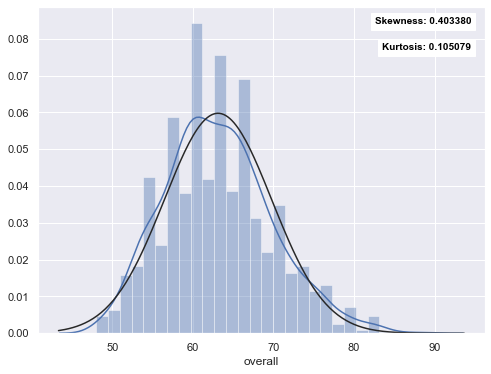

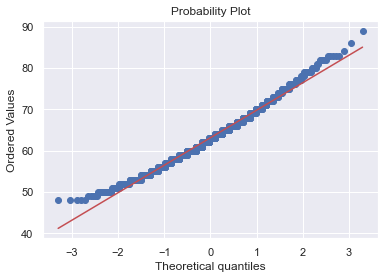

In [384]:
f, ax = plt.subplots(figsize=(8,6))
x = df['overall']
ax = sns.distplot(x, fit= norm)
ax.text(x=0.97, y=0.97, transform=ax.transAxes, s="Skewness: %f" % df['overall'].skew(),\
    fontweight='demibold', fontsize=10, va='top', ha='right',\
    backgroundcolor='white', color='black')
ax.text(x=0.97, y=0.89, transform=ax.transAxes, s="Kurtosis: %f" % df['overall'].kurt(),\
    fontweight='demibold', fontsize=10, va='top', ha='right',\
    backgroundcolor='white', color='black')
plt.show()
ax = stats.probplot(x, plot=plt)
plt.show()

Noice! The variable is roughly normally distributed. The skew and kurtosis isn't too bad. QQ plot's relatively a straight line too.

Phew. I was worrying about having to transform this.

Let's make a plotting function for convenience.

In [385]:
def distributionplot(features):
    #f, ax = plt.subplots(figsize=(8,6))
    f, ax = plt.subplots(3, 4, sharey=False, figsize=(16, 12))
    i = 0
    for feature in features:
        x = df[feature]
        sns.distplot(x, fit= norm, ax = ax[0,i])
        ax[0,i].text(x=0.97, y=0.97, transform=ax[0,i].transAxes, s="Skewness: %f" % df[feature].skew(),\
            fontweight='demibold', fontsize=7, va='top', ha='right',\
            backgroundcolor='white', color='black')
        ax[0,i].text(x=0.97, y=0.89, transform=ax[0,i].transAxes, s="Kurtosis: %f" % df[feature].kurt(),\
            fontweight='demibold', fontsize=7, va='top', ha='right',\
            backgroundcolor='white', color='black')
        stats.probplot(x, plot=ax[1,i])
        ax[1,i].set_title("")
        sns.residplot(x, df['overall'], lowess=True,scatter_kws={'alpha':0.3, 'marker':'d'}, ax = ax[2,i])
        i+=1

    plt.show()

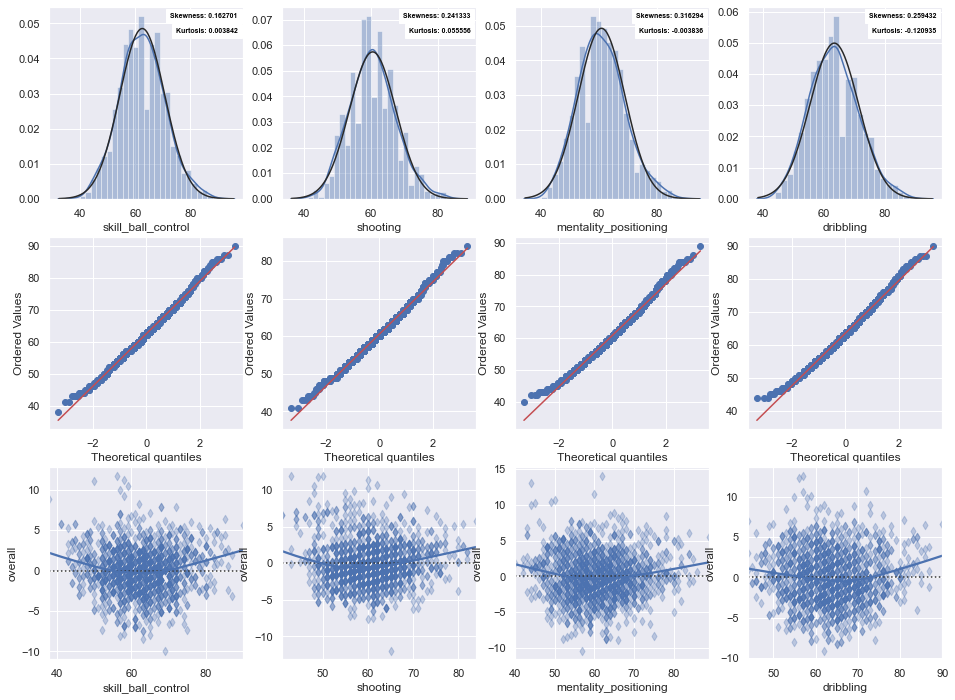

In [386]:
distributionplot(['skill_ball_control','shooting','mentality_positioning','dribbling'])

Noice! Notice how the residuals have no structure? This property is called homoscedasticity, and is necessary for linear regression. Moving on.

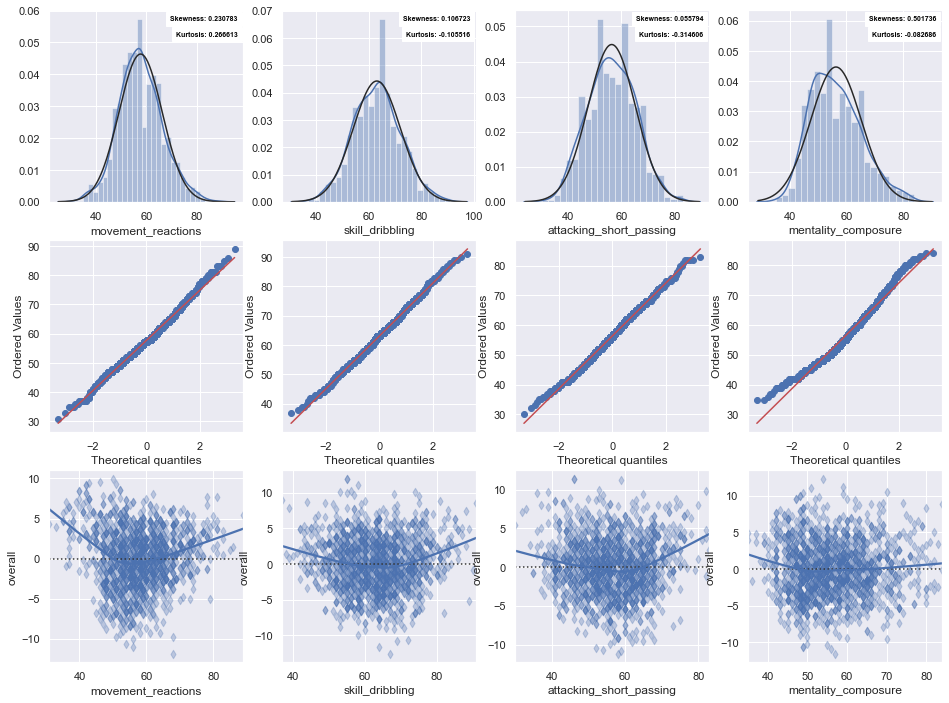

In [387]:
distributionplot(['movement_reactions','skill_dribbling','attacking_short_passing','mentality_composure'])

Ohkay, composure mentality has more skew than I can take, for such a correlated feature.

Let's try 2 transforms - the boring old (log+1) and the fancier Box Cox transform.

In [388]:
df['mentality_composure_log'] = np.log1p(df['mentality_composure'])
df['mentality_composure_boxcox'] = stats.boxcox(df['mentality_composure'])[0]

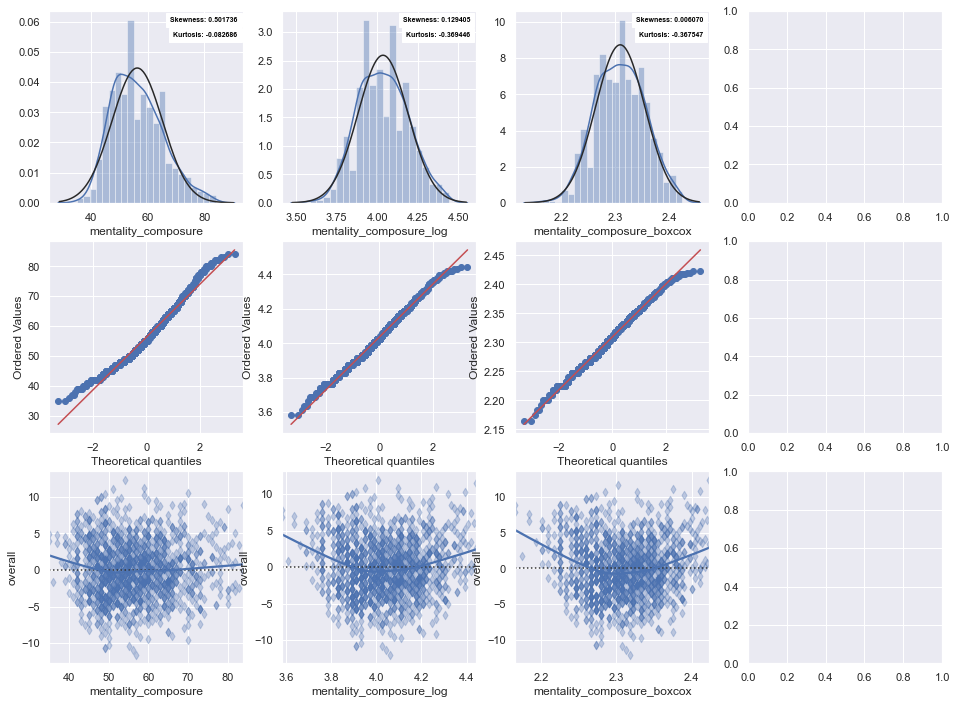

In [389]:
distributionplot(['mentality_composure','mentality_composure_log','mentality_composure_boxcox'])

Noice! Box Cox pretty much gets rid of the skewness. Let's remove the log transformed feature.

In [390]:
df.drop(columns = ['mentality_composure_log','mentality_composure'], inplace = True)

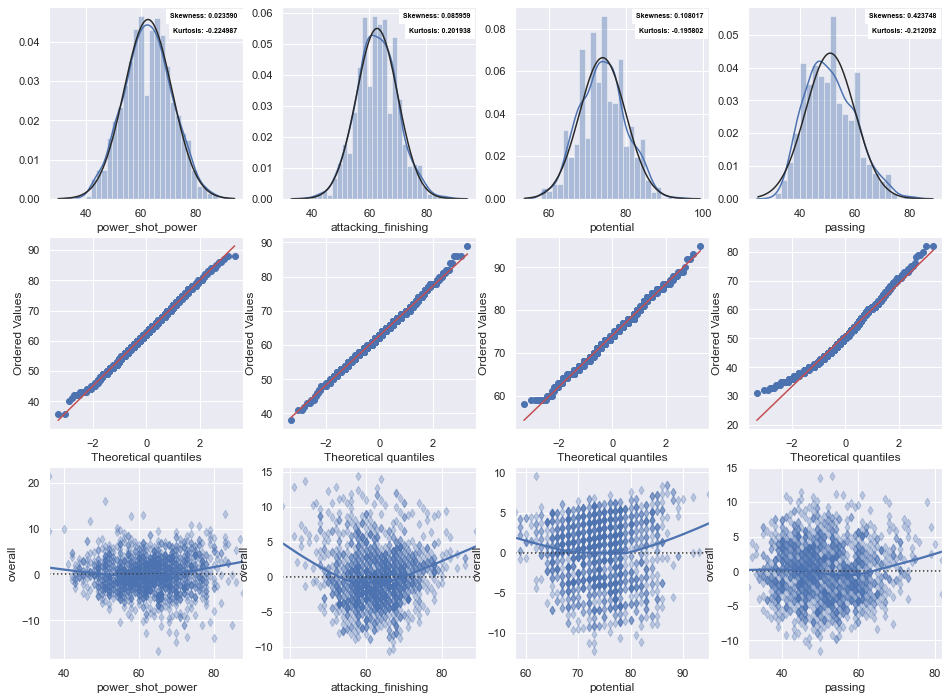

In [391]:
distributionplot(['power_shot_power','attacking_finishing','potential','passing'])

Passing looks a little off. Let do the same thing.

In [392]:
df['passing_log'] = np.log1p(df['passing'])
df['passing_boxcox'] = stats.boxcox(df['passing'])[0]

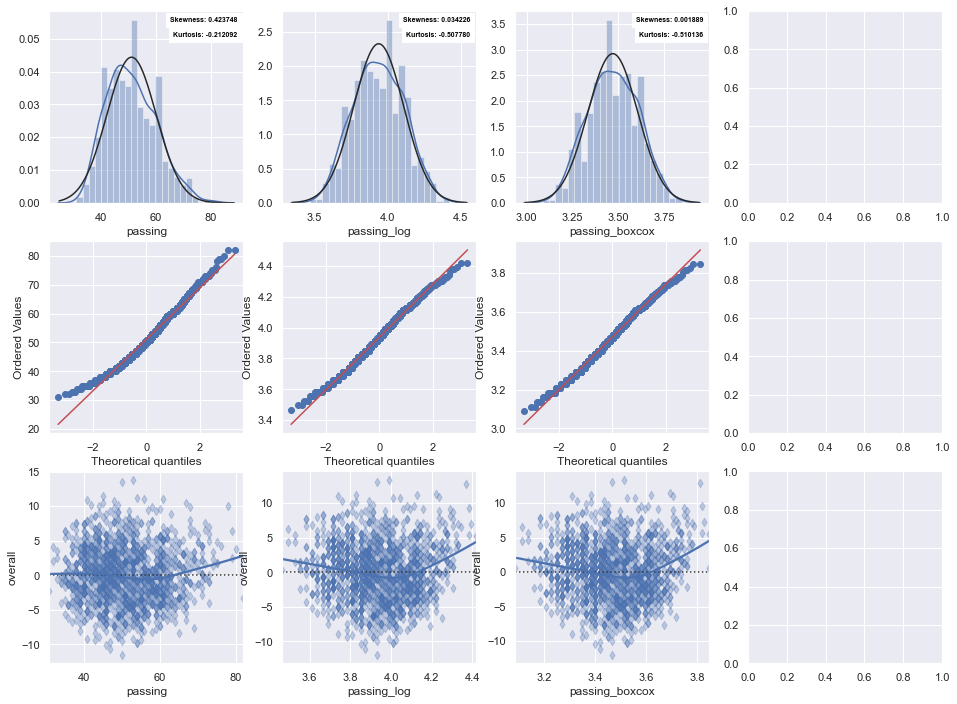

In [393]:
distributionplot(['passing','passing_log','passing_boxcox'])

Box Cox to the rescue again!

In [394]:
df.drop(columns = ['passing_log','passing'], inplace = True)

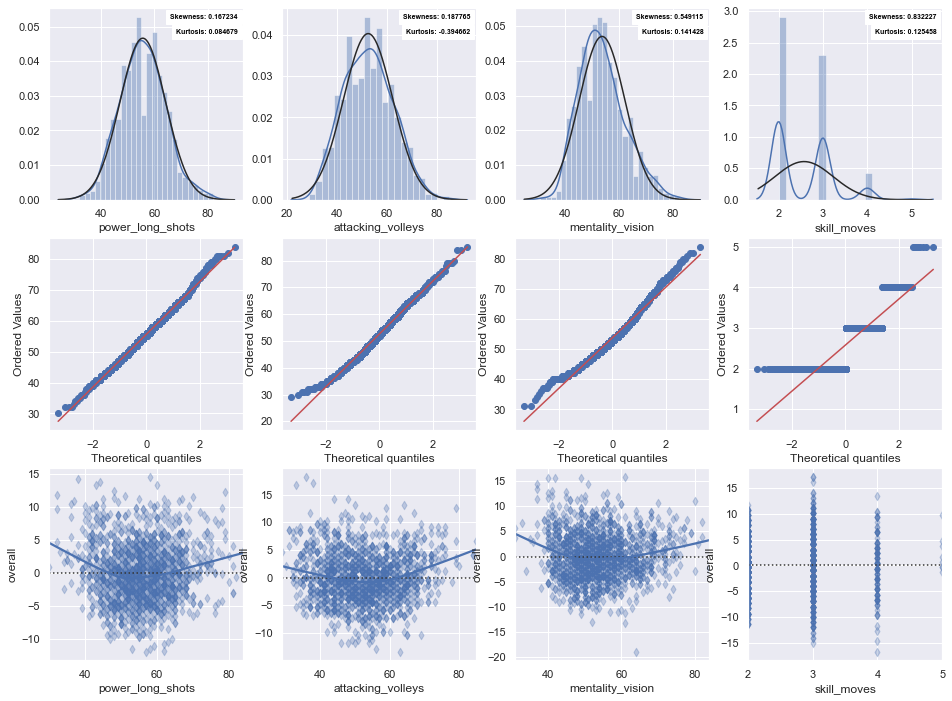

In [395]:
distributionplot(['power_long_shots','attacking_volleys','mentality_vision','skill_moves'])

Alright. Let's fix vision mentality's skew. And skill moves seems like an ordinal variable.

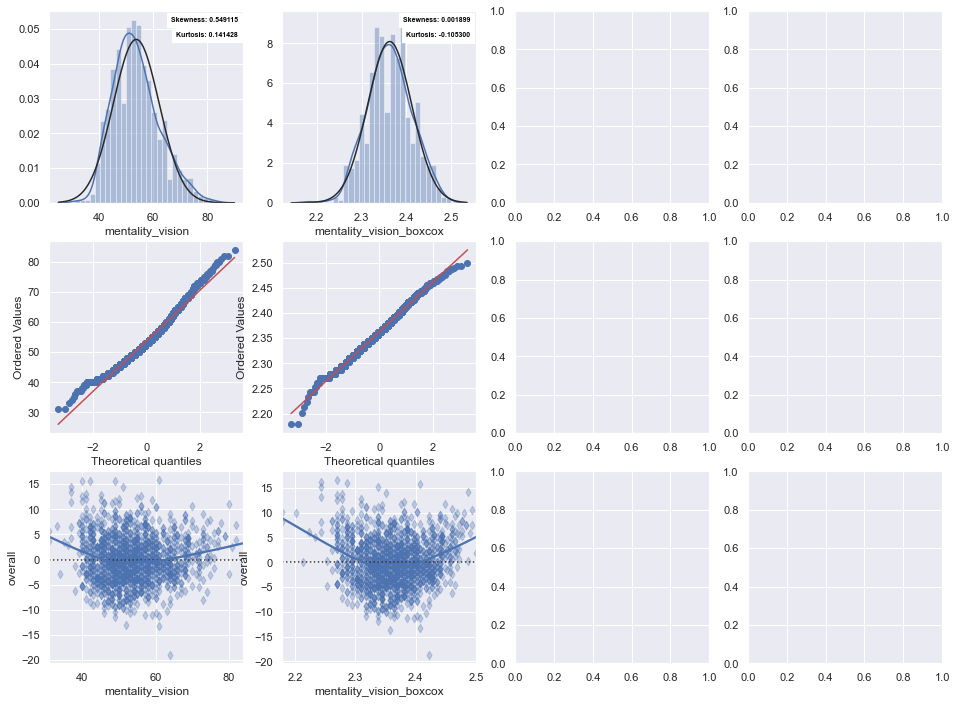

In [396]:
df['mentality_vision_boxcox'] = stats.boxcox(df['mentality_vision'])[0]
distributionplot(['mentality_vision','mentality_vision_boxcox'])

In [397]:
df.drop(columns = ['mentality_vision'], inplace = True)

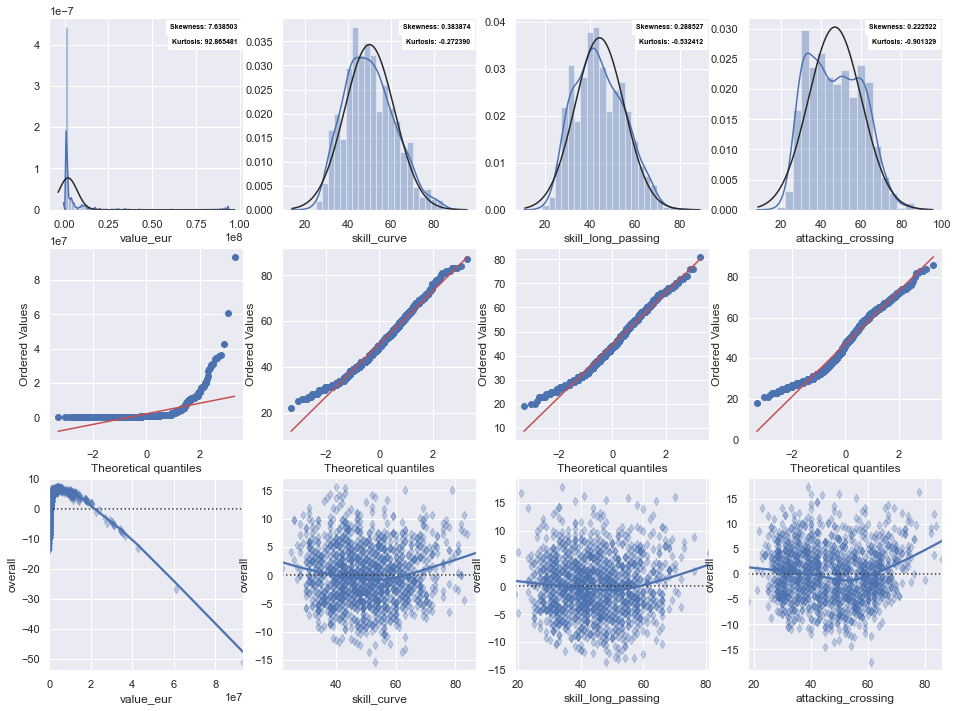

In [398]:
distributionplot(['value_eur','skill_curve','skill_long_passing','attacking_crossing'])

First on to the disaster that is value in euro.

In [399]:
df['value_eur_log'] = np.log1p(df['value_eur'])
df['value_eur_boxcox'] = stats.boxcox(1 + df['value_eur'])[0]

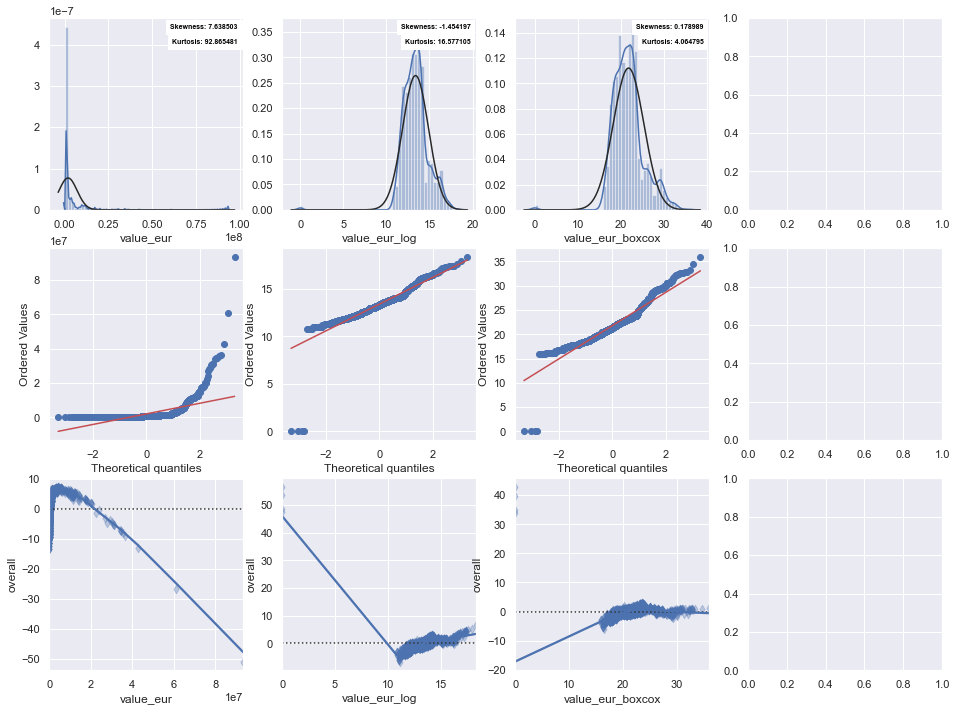

In [400]:
distributionplot(['value_eur','value_eur_log','value_eur_boxcox'])

Kind of interested in seeing the correlation now. Obviously there's outliers. We'll get to them later.

In [401]:
stats.pearsonr(df['overall'], df['value_eur_boxcox'])

(0.9286839411480475, 0.0)

0.9286 all the way up from 0.649? That is unreal!

In [402]:
df.drop(columns = ['value_eur','value_eur_log'], inplace = True)

Attacking Crossing is clearly bimodal. I don't want to transform this, as it already has a high value of kurtosis.

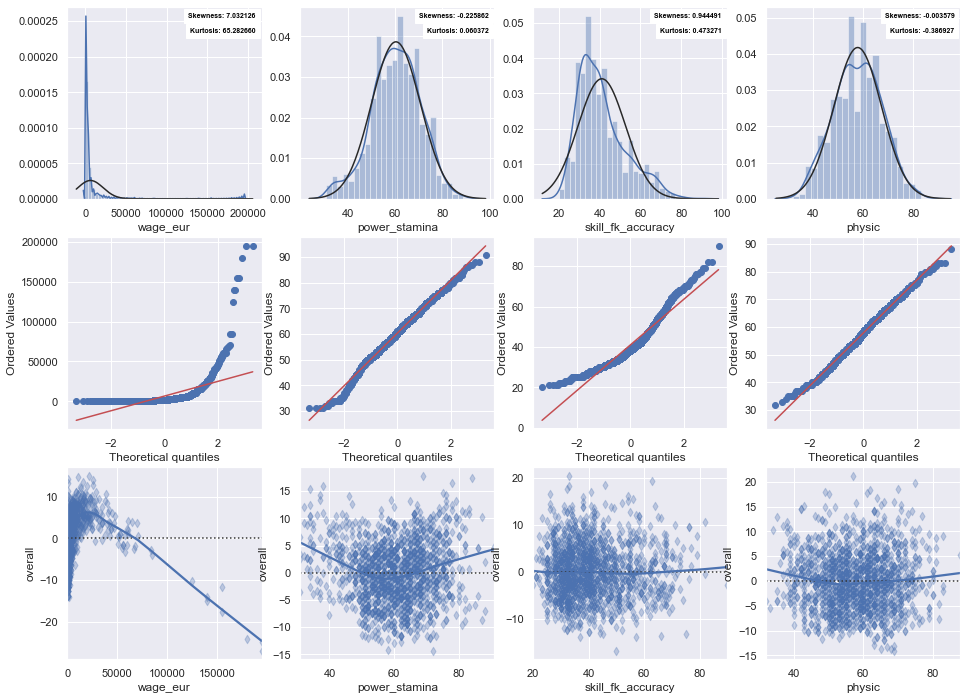

In [403]:
distributionplot(['wage_eur','power_stamina','skill_fk_accuracy','physic'] )

In [404]:
df['wage_eur_log'] = np.log1p(df['wage_eur'])
df['wage_eur_boxcox'] = stats.boxcox(1 + df['wage_eur'])[0]

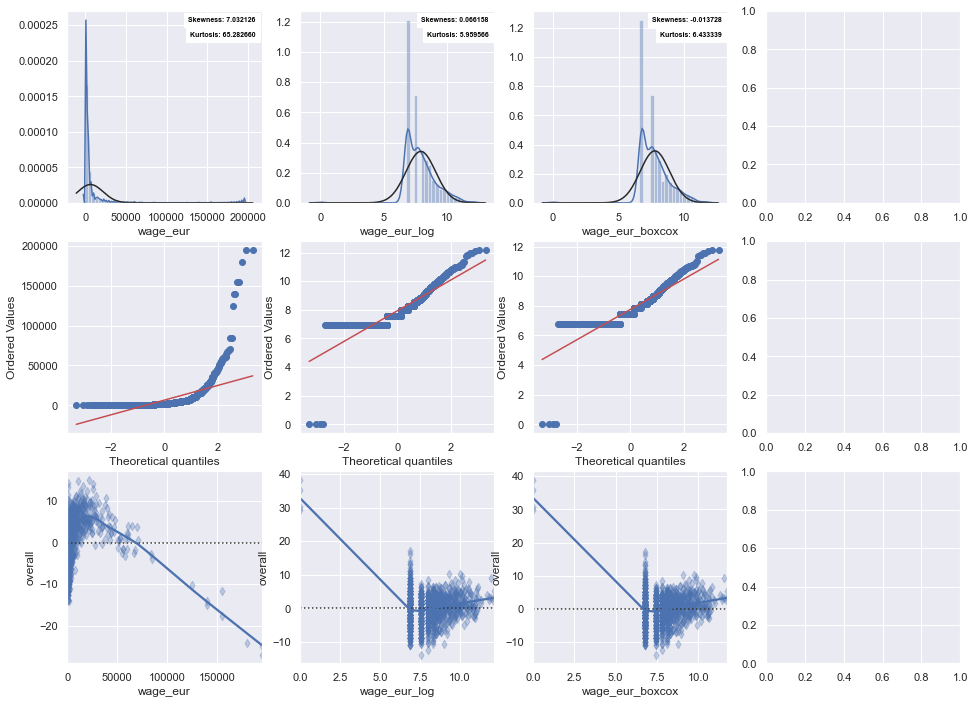

In [405]:
distributionplot(['wage_eur','wage_eur_log','wage_eur_boxcox'])

In [406]:
stats.pearsonr(df['overall'], df['wage_eur_boxcox'])

(0.7331399737455874, 5.0006074003473905e-239)

In [407]:
df.drop(columns = ['wage_eur','wage_eur_log'], inplace = True)

In [408]:
df['skill_fk_accuracy_boxcox'] = stats.boxcox(df['skill_fk_accuracy'])[0]

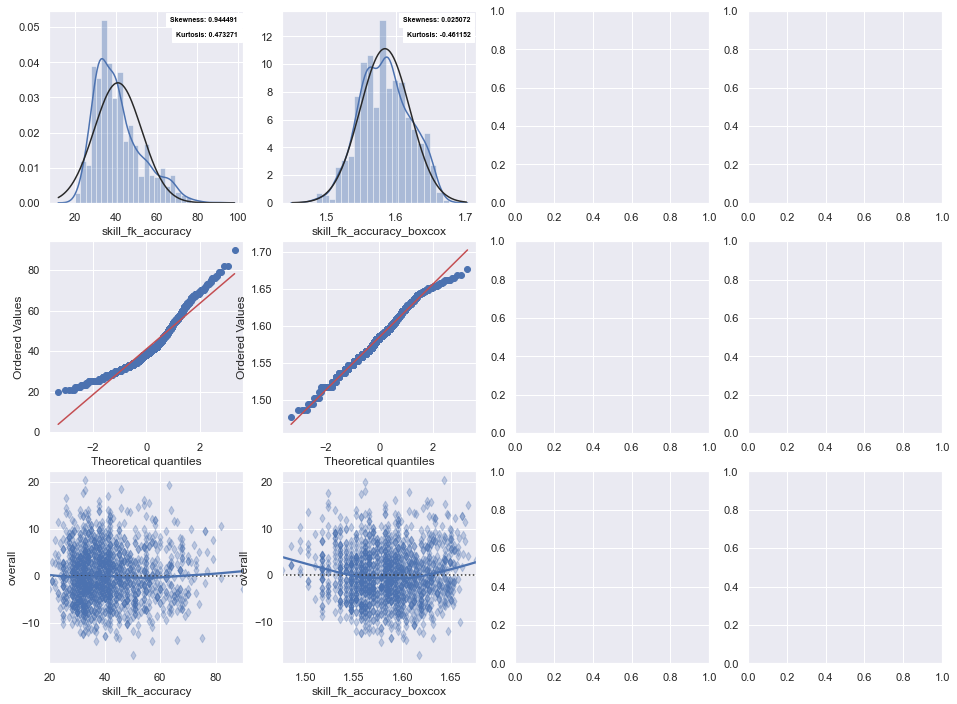

In [409]:
distributionplot(['skill_fk_accuracy','skill_fk_accuracy_boxcox'])

In [410]:
df.drop(columns = ['skill_fk_accuracy'], inplace = True)

Just a few more.

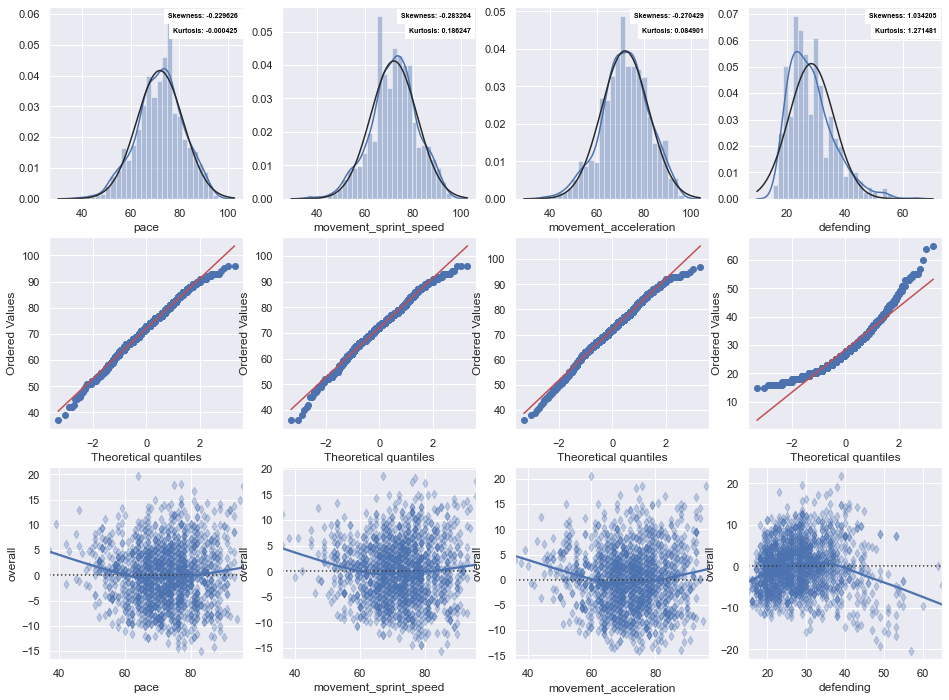

In [411]:
distributionplot(['pace','movement_sprint_speed','movement_acceleration','defending'])

In [412]:
df['defending_boxcox'] = stats.boxcox(df['defending'])[0]

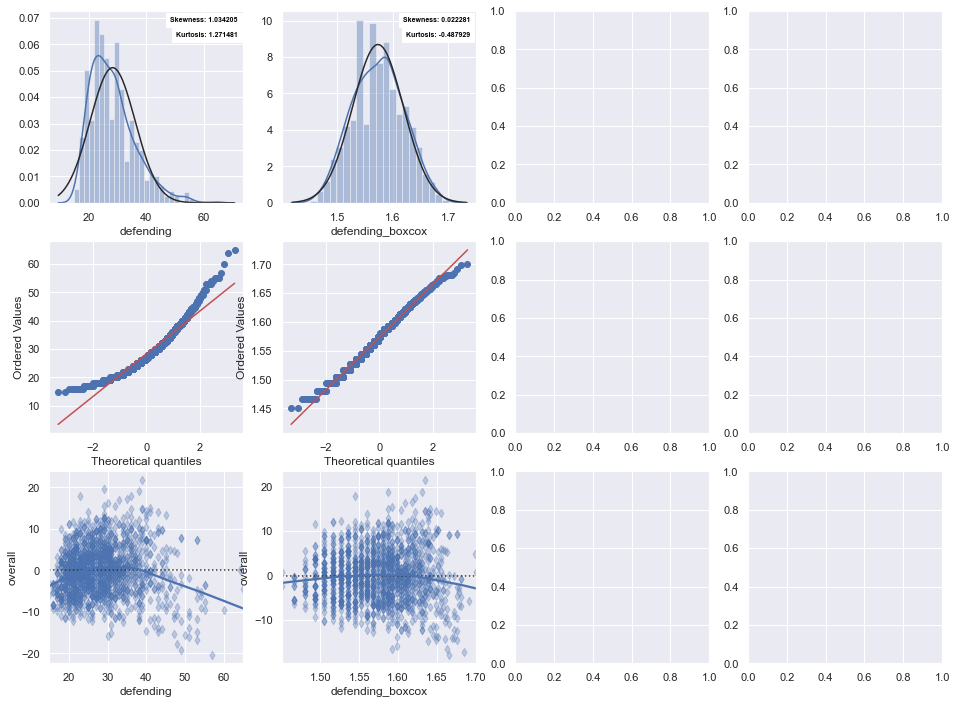

In [413]:
distributionplot(['defending','defending_boxcox'])

In [414]:
df.drop(columns = ['defending'], inplace = True)

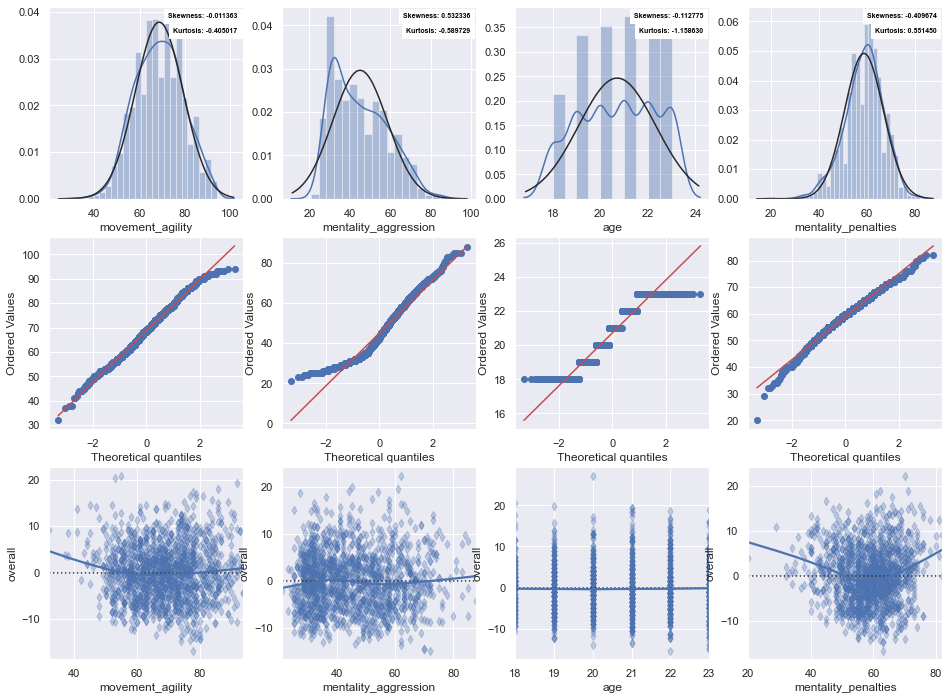

In [415]:
distributionplot(['movement_agility','mentality_aggression','age','mentality_penalties' ])

Age is ordinal too. We'll let it be. On to mentality aggression.

In [416]:
df['mentality_aggression_boxcox'] = stats.boxcox(df['mentality_aggression'])[0]

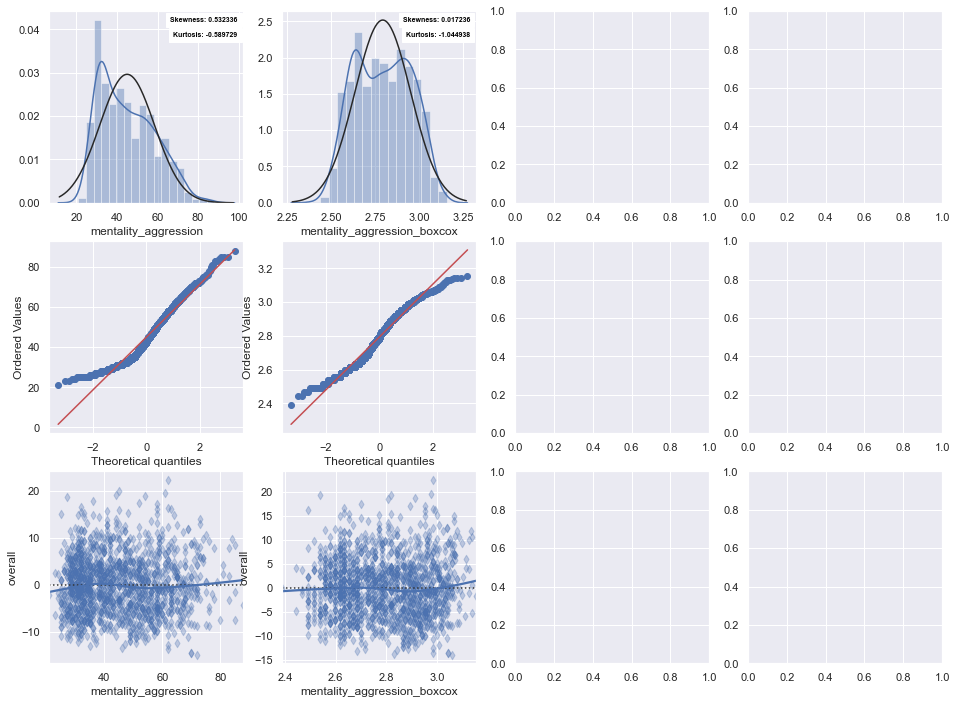

In [417]:
distributionplot(['mentality_aggression','mentality_aggression_boxcox'])

In [418]:
df.drop(columns = ['mentality_aggression'], inplace = True)

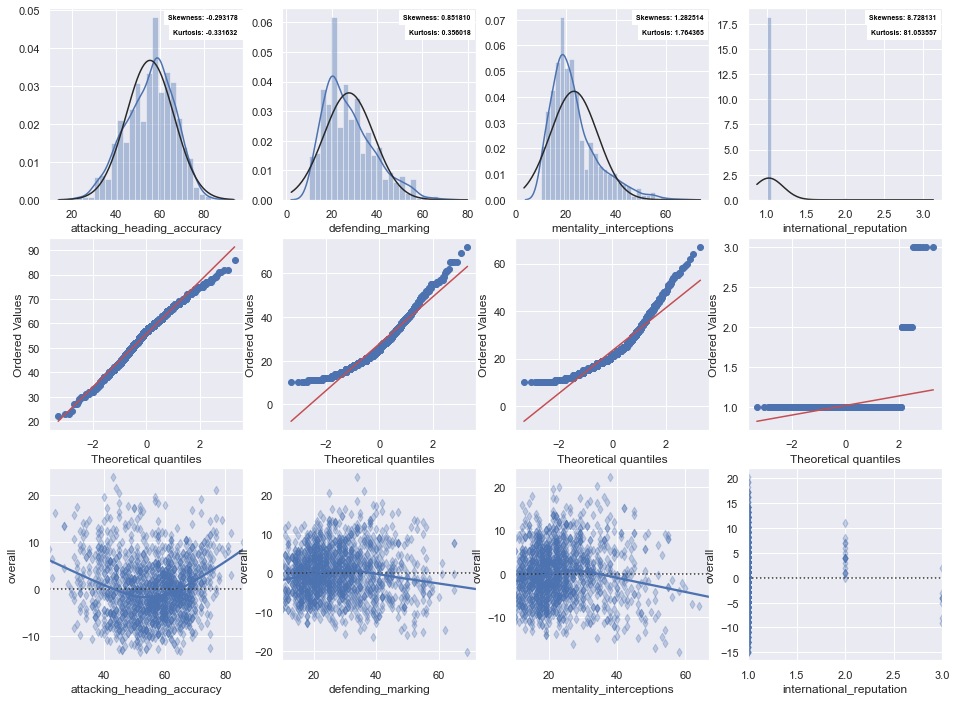

In [419]:
distributionplot(['attacking_heading_accuracy','defending_marking','mentality_interceptions','international_reputation'])

In [420]:
df['defending_marking_boxcox'] = stats.boxcox(df['defending_marking'])[0]

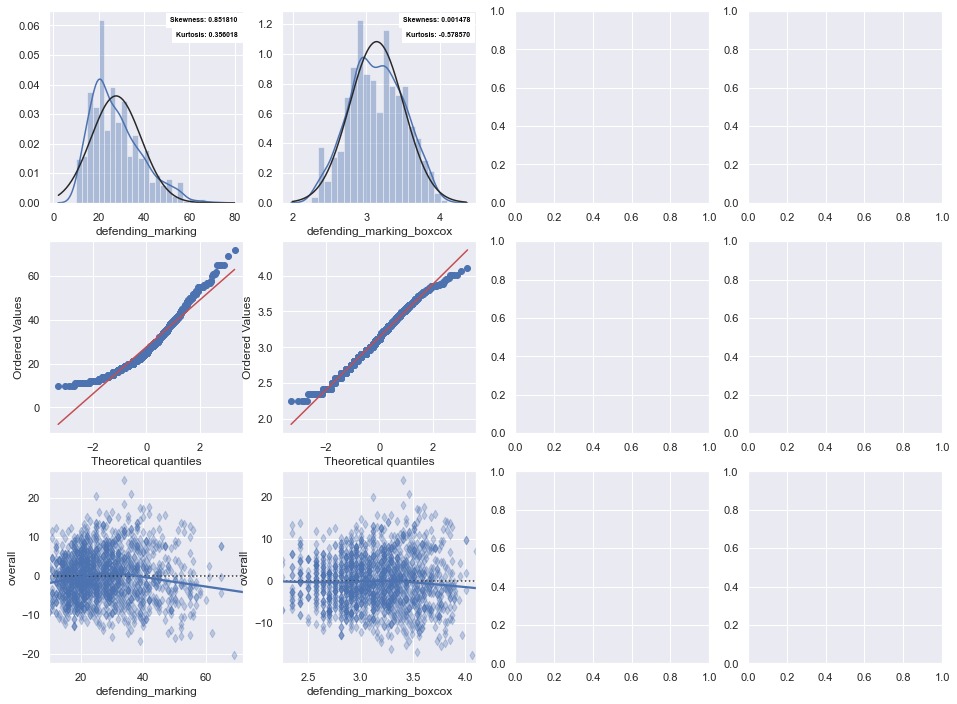

In [421]:
distributionplot(['defending_marking','defending_marking_boxcox'])

In [422]:
df.drop(columns = ['defending_marking'], inplace = True)

In [423]:
df['mentality_interceptions_boxcox'] = stats.boxcox(df['mentality_interceptions'])[0]

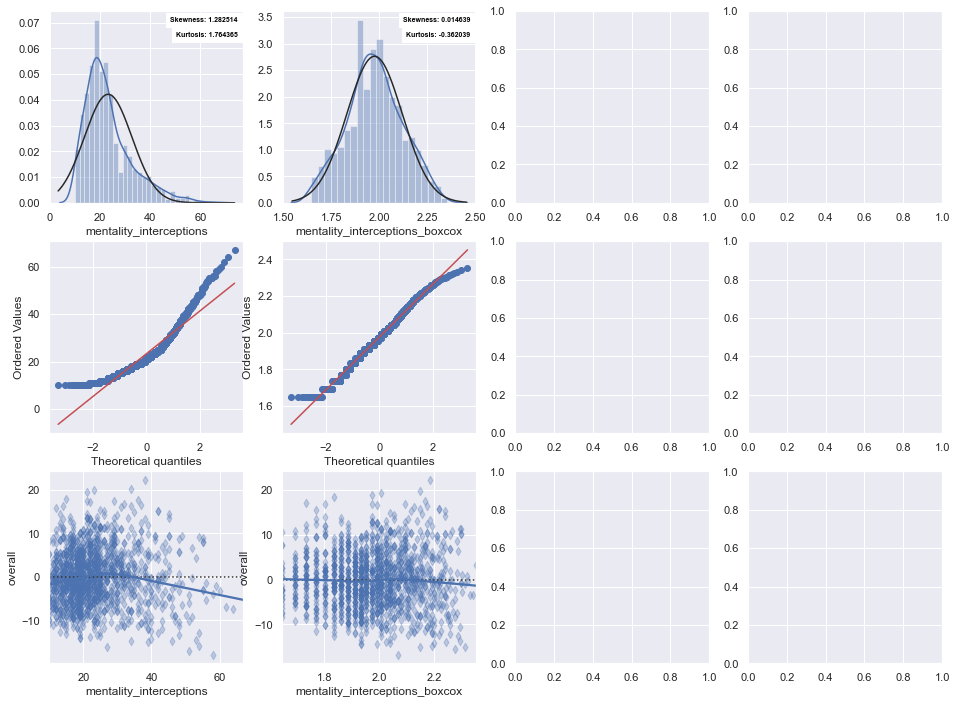

In [424]:
distributionplot(['mentality_interceptions','mentality_interceptions_boxcox'])

In [425]:
df.drop(columns = ['mentality_interceptions'], inplace = True)

Last set!

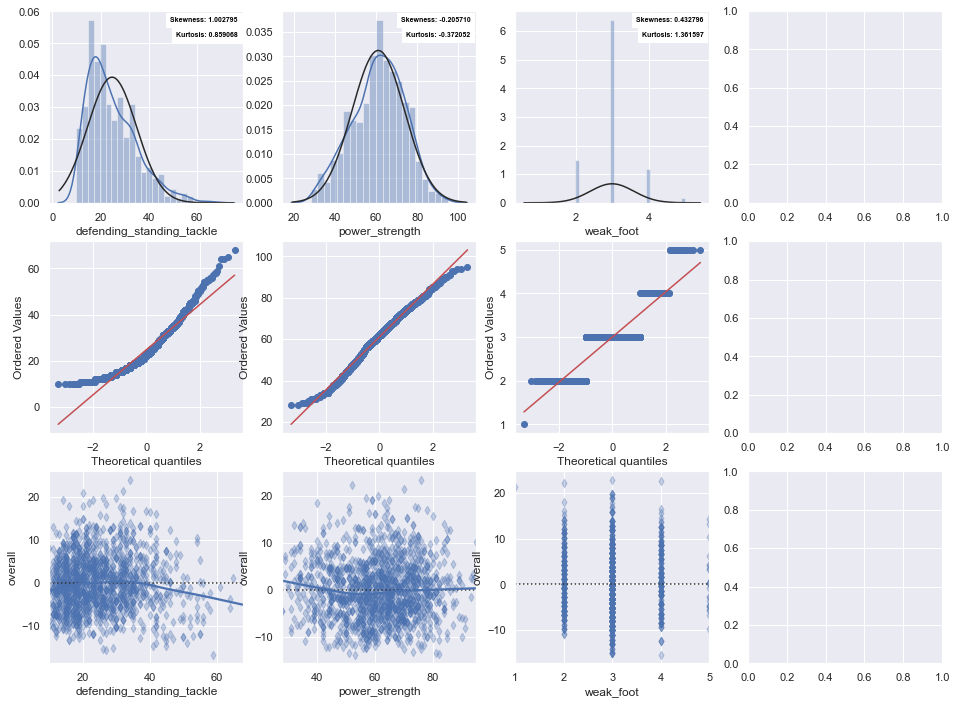

In [426]:
distributionplot(['defending_standing_tackle','power_strength','weak_foot'])

In [427]:
df['defending_standing_tackle_boxcox'] = stats.boxcox(df['defending_standing_tackle'])[0]

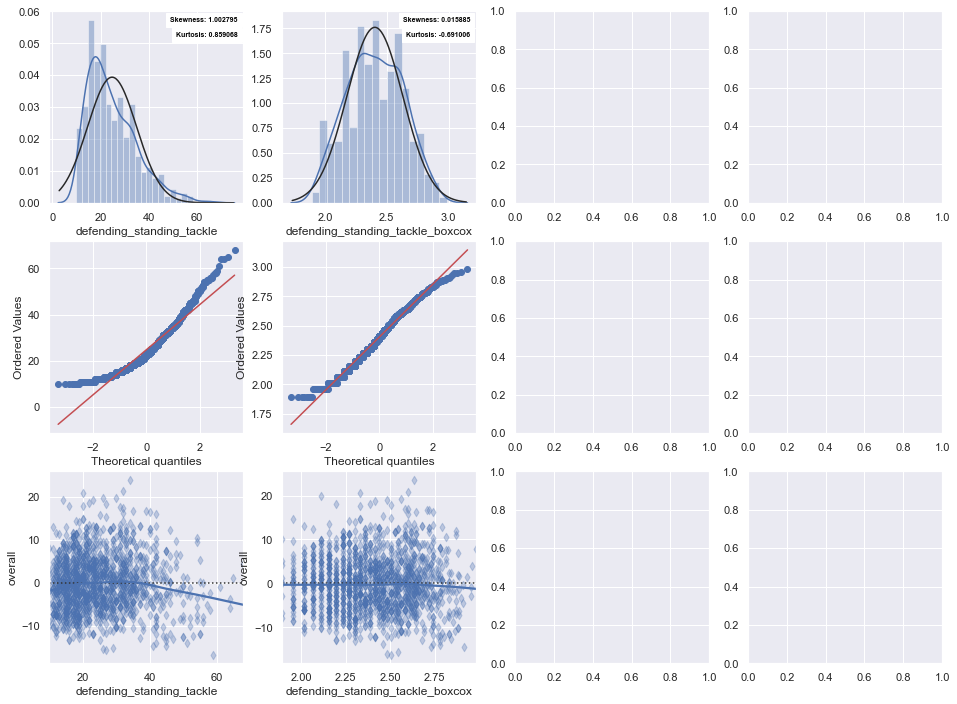

In [428]:
distributionplot(['defending_standing_tackle','defending_standing_tackle_boxcox'])

In [429]:
df.drop(columns = ['defending_standing_tackle'], inplace = True)

There! We're done. Let's check the correlations now.

In [430]:
corrdf = pd.DataFrame(columns=['Feature', 'PearsonR_Correlation', 'P_Value'])

cols = list(df.select_dtypes('float64').columns)

for col in cols:
    pearson_coeff, p_value = stats.pearsonr(df['overall'], df[col])
    corrdf.loc[len(corrdf)] = [col, pearson_coeff, p_value]

In [431]:
corrdf.sort_values('PearsonR_Correlation', ascending=False)

,Feature,PearsonR_Correlation,P_Value
1,overall,1.000000,0.000000e+00
32,value_eur_boxcox,0.928684,0.000000e+00
18,skill_ball_control,0.905833,0.000000e+00
7,shooting,0.891646,0.000000e+00
27,mentality_positioning,0.876494,0.000000e+00
8,dribbling,0.867912,0.000000e+00
22,movement_reactions,0.840501,0.000000e+00
15,skill_dribbling,0.835800,0.000000e+00
13,attacking_short_passing,0.835036,0.000000e+00
23,power_shot_power,0.815798,0.000000e+00


**Outlier Detection**

Let's have a jointplot of the most correlated variables against the target.

In [432]:
features = ['value_eur_boxcox','skill_ball_control','shooting','mentality_positioning','dribbling','movement_reactions','skill_dribbling','attacking_short_passing','power_shot_power', 'mentality_composure_boxcox']

In [433]:
len(features)

10

In [434]:
def jointplottergrid(features):
    f, ax = plt.subplots(10, sharey=False, figsize=(8,80))
    i = 0
    for feature in features:
        x = df[feature]
        sns.scatterplot(x = x, y= "overall", color = "r", alpha = 0.5,  data=df, ax = ax[i])
        i+=1

    plt.show()

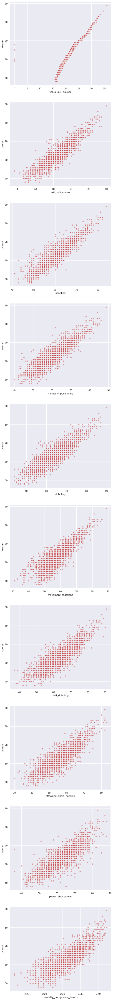

In [435]:
jointplottergrid(features)

Alright, so here's what I see. Some players have a value of zero. Let's look at them.

In [436]:
df.loc[ df['value_eur_boxcox']==0 , : ]

,position1,position2,age,nationality,club,overall,potential,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,pace,shooting,dribbling,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,power_shot_power,power_stamina,power_strength,power_long_shots,mentality_positioning,mentality_penalties,mentality_composure_boxcox,passing_boxcox,mentality_vision_boxcox,value_eur_boxcox,wage_eur_boxcox,skill_fk_accuracy_boxcox,defending_boxcox,mentality_aggression_boxcox,defending_marking_boxcox,mentality_interceptions_boxcox,defending_standing_tackle_boxcox
323,ST,,23.0,Slovenia,Slovenia,68.0,75.0,Right,1.0,3.0,3.0,Medium/Medium,76.0,66.0,75.0,48.0,48.0,74.0,62.0,61.0,56.0,75.0,56.0,55.0,73.0,78.0,74.0,83.0,65.0,62.0,65.0,44.0,56.0,70.0,55.0,2.290518,3.540266,2.391348,0.0,0.0,1.574307,1.592831,2.633649,3.560064,1.933106,2.331214
540,ST,RW,23.0,Bolivia,Bolivia,65.0,73.0,Right,1.0,3.0,2.0,Medium/Low,65.0,67.0,59.0,52.0,29.0,70.0,72.0,58.0,57.0,63.0,49.0,49.0,50.0,68.0,63.0,58.0,60.0,66.0,77.0,47.0,65.0,68.0,68.0,2.272660,3.434127,2.374772,0.0,0.0,1.541773,1.552626,2.536852,2.910401,1.734379,2.331214
917,ST,,18.0,Bulgaria,Bulgaria,60.0,75.0,Right,1.0,3.0,2.0,Medium/Medium,62.0,57.0,56.0,54.0,49.0,57.0,62.0,57.0,48.0,52.0,49.0,52.0,61.0,64.0,60.0,51.0,58.0,59.0,50.0,47.0,51.0,66.0,63.0,2.346016,3.511476,2.374772,0.0,0.0,1.612055,1.648602,3.059765,3.605466,2.275580,2.614986
1054,CF,CAM,22.0,New Zealand,New Zealand,59.0,66.0,Right,1.0,2.0,2.0,High/Medium,64.0,56.0,58.0,59.0,49.0,62.0,60.0,57.0,43.0,58.0,33.0,57.0,59.0,62.0,66.0,56.0,55.0,51.0,62.0,69.0,50.0,63.0,58.0,2.312339,3.496645,2.368985,0.0,0.0,1.557061,1.574429,2.597201,3.226855,2.007773,2.331214


Lets replace these values with the mean values for players with the same shooting as these players.

In [437]:
df.loc[323, 'value_eur_boxcox'] = df.loc[df['shooting']==66, 'value_eur_boxcox'].mean()
df.loc[540, 'value_eur_boxcox'] = df.loc[df['shooting']==67, 'value_eur_boxcox'].mean()
df.loc[917, 'value_eur_boxcox'] = df.loc[df['shooting']==57, 'value_eur_boxcox'].mean()
df.loc[1054, 'value_eur_boxcox'] = df.loc[df['shooting']==56, 'value_eur_boxcox'].mean()

In [438]:
df.loc[[323,540,917,1054],['value_eur_boxcox','shooting'] ]

,value_eur_boxcox,shooting
323,23.390438,66.0
540,24.118198,67.0
917,19.652270,57.0
1054,19.502135,56.0


The rest of the features we investigated didn't have any glaring outliers like that, except one particularly talented player.

In [439]:
df.loc[ df['value_eur_boxcox']>35 , : ]

,position1,position2,age,nationality,club,overall,potential,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,pace,shooting,dribbling,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,power_shot_power,power_stamina,power_strength,power_long_shots,mentality_positioning,mentality_penalties,mentality_composure_boxcox,passing_boxcox,mentality_vision_boxcox,value_eur_boxcox,wage_eur_boxcox,skill_fk_accuracy_boxcox,defending_boxcox,mentality_aggression_boxcox,defending_marking_boxcox,mentality_interceptions_boxcox,defending_standing_tackle_boxcox
0,ST,RW,20.0,France,Paris Saint-Germain,89.0,95.0,Right,3.0,4.0,5.0,High/Low,96.0,84.0,90.0,75.0,78.0,89.0,77.0,82.0,79.0,91.0,79.0,70.0,90.0,96.0,96.0,92.0,89.0,83.0,84.0,76.0,79.0,89.0,70.0,2.423335,3.808522,2.486468,35.938593,11.560349,1.642685,1.634495,2.985453,3.408523,2.184214,2.63113


We don't have any names here, but I'm pretty sure thats Mbappe. Sorry kid, you're just too good.

In [440]:
df.drop(0, inplace=True)

I'm guessing the wage feature has some trouble going on too.

In [442]:
df.loc[ df['wage_eur_boxcox']==0 , : ]

,position1,position2,age,nationality,club,overall,potential,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,pace,shooting,dribbling,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,power_shot_power,power_stamina,power_strength,power_long_shots,mentality_positioning,mentality_penalties,mentality_composure_boxcox,passing_boxcox,mentality_vision_boxcox,value_eur_boxcox,wage_eur_boxcox,skill_fk_accuracy_boxcox,defending_boxcox,mentality_aggression_boxcox,defending_marking_boxcox,mentality_interceptions_boxcox,defending_standing_tackle_boxcox
323,ST,,23.0,Slovenia,Slovenia,68.0,75.0,Right,1.0,3.0,3.0,Medium/Medium,76.0,66.0,75.0,48.0,48.0,74.0,62.0,61.0,56.0,75.0,56.0,55.0,73.0,78.0,74.0,83.0,65.0,62.0,65.0,44.0,56.0,70.0,55.0,2.290518,3.540266,2.391348,23.390438,0.0,1.574307,1.592831,2.633649,3.560064,1.933106,2.331214
540,ST,RW,23.0,Bolivia,Bolivia,65.0,73.0,Right,1.0,3.0,2.0,Medium/Low,65.0,67.0,59.0,52.0,29.0,70.0,72.0,58.0,57.0,63.0,49.0,49.0,50.0,68.0,63.0,58.0,60.0,66.0,77.0,47.0,65.0,68.0,68.0,2.272660,3.434127,2.374772,24.118198,0.0,1.541773,1.552626,2.536852,2.910401,1.734379,2.331214
917,ST,,18.0,Bulgaria,Bulgaria,60.0,75.0,Right,1.0,3.0,2.0,Medium/Medium,62.0,57.0,56.0,54.0,49.0,57.0,62.0,57.0,48.0,52.0,49.0,52.0,61.0,64.0,60.0,51.0,58.0,59.0,50.0,47.0,51.0,66.0,63.0,2.346016,3.511476,2.374772,19.652270,0.0,1.612055,1.648602,3.059765,3.605466,2.275580,2.614986
1054,CF,CAM,22.0,New Zealand,New Zealand,59.0,66.0,Right,1.0,2.0,2.0,High/Medium,64.0,56.0,58.0,59.0,49.0,62.0,60.0,57.0,43.0,58.0,33.0,57.0,59.0,62.0,66.0,56.0,55.0,51.0,62.0,69.0,50.0,63.0,58.0,2.312339,3.496645,2.368985,19.502135,0.0,1.557061,1.574429,2.597201,3.226855,2.007773,2.331214


The same 4 players. Let's do the same fix.

In [443]:
df.loc[323, 'wage_eur_boxcox'] = df.loc[df['shooting']==66, 'wage_eur_boxcox'].mean()
df.loc[540, 'wage_eur_boxcox'] = df.loc[df['shooting']==67, 'wage_eur_boxcox'].mean()
df.loc[917, 'wage_eur_boxcox'] = df.loc[df['shooting']==57, 'wage_eur_boxcox'].mean()
df.loc[1054, 'wage_eur_boxcox'] = df.loc[df['shooting']==56, 'wage_eur_boxcox'].mean()

In [444]:
df.loc[[323,540,917,1054],['wage_eur_boxcox','shooting'] ]

,wage_eur_boxcox,shooting
323,8.115799,66.0
540,8.328670,67.0
917,7.142362,57.0
1054,7.110773,56.0


It is worth noting how the Box Cox transform has made features more robust to outliers, in addition to fixing the skew.

At this stage, at least, can we dare to make a correlation heatmap of these features we've worked on so far? XD

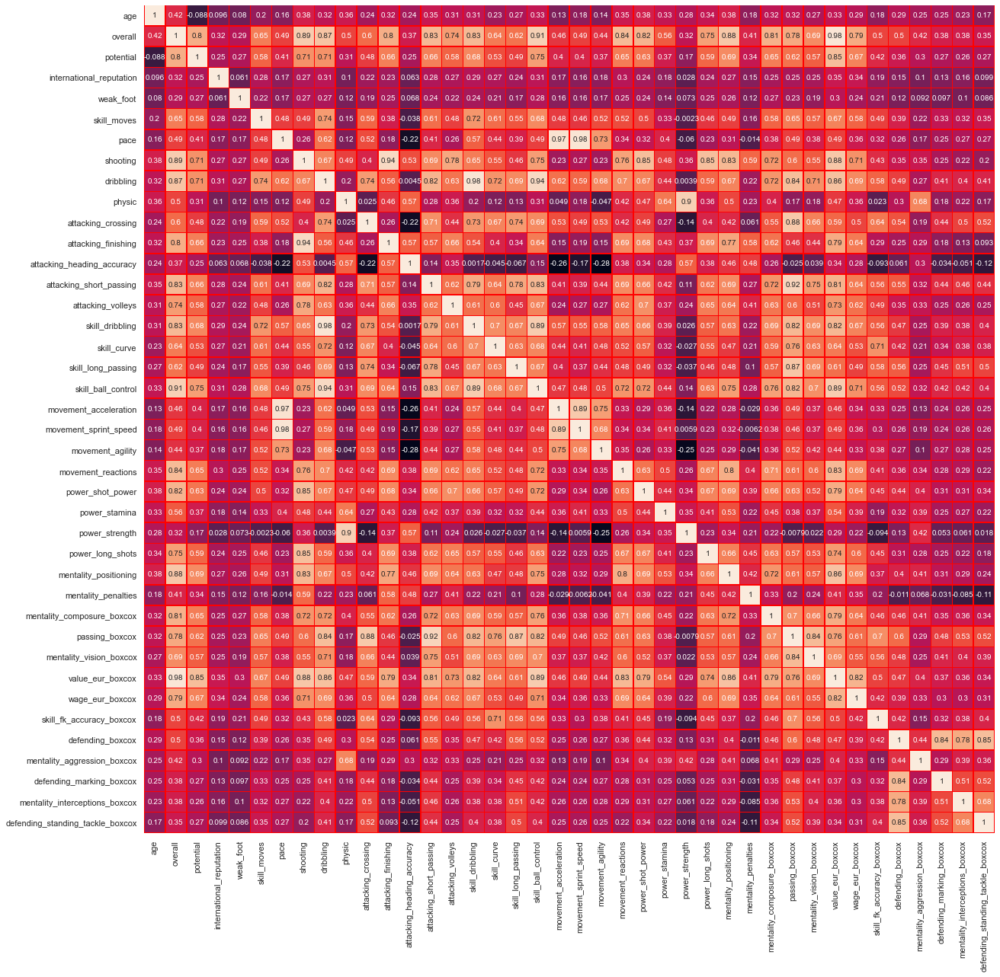

In [445]:
plt.figure(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, linecolor = "red", linewidths = 0.5, cbar = False);

Tons and tons of data! Let's try to analyze where we have multicollinearity.

*  attacking_finishing with shooting (0.94)
*  movement_acceleration and movement_sprint_speed with pace (0.97, 0.98)
*  skill_dribbling and skill_ball control with dribbling (0.98, 0.94)
*  attacking_short_passing with passing_boxcox (0.92)

Alright. So the detailed stats are correlated to their corresponding base stats. Not surprising at all.

Time for dimensionality reduction!

**Principle Component Analysis**

In [446]:
features = ['attacking_finishing','movement_acceleration','movement_sprint_speed','attacking_short_passing']

In [447]:
todrop = ['skill_dribbling','skill_ball_control']

In [448]:
df.drop(columns = todrop, inplace=True)

We need to standardize features for PCA.

In [449]:
for f in features:
    df[f]=(df[f]-df[f].mean())/df[f].std()

In [450]:
x = df.loc[:,features].values

pca = PCA()
pca.fit_transform(x)

array([[ 4.76743229,  1.08306372, -0.18645748,  0.23145486],
       [ 4.6592798 ,  1.07153863,  0.21096497, -0.02102022],
       [ 2.62045729,  2.7402166 , -0.642188  , -0.03101762],
       ...,
       [-2.67881285, -1.07137975,  0.43663081, -0.83928447],
       [-2.60389327, -1.33854234,  0.36393894, -0.47811633],
       [-3.19688683, -0.51761728,  0.25321536, -0.30395479]])

In [451]:
explained_variance=pca.explained_variance_ratio_

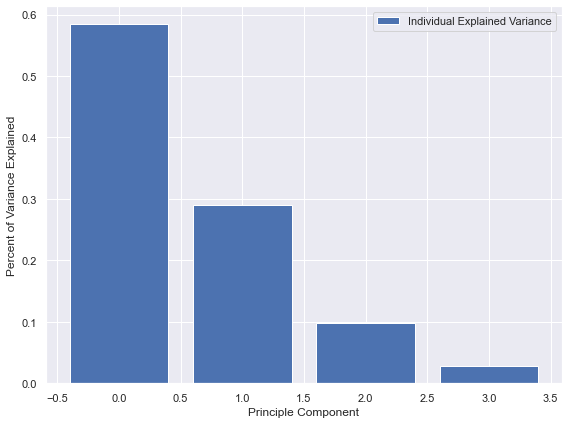

In [452]:
plt.figure(figsize=(8, 6))

plt.bar(range(explained_variance.shape[0]), explained_variance,label='Individual Explained Variance', align='center')
plt.ylabel('Percent of Variance Explained')
plt.xlabel('Principle Component')
plt.legend(loc='best')
plt.tight_layout()

Cool! The first 3 components explain most of the variance. So let's just keep 3.

In [453]:
pca=PCA(n_components=3)
x=pca.fit_transform(x)

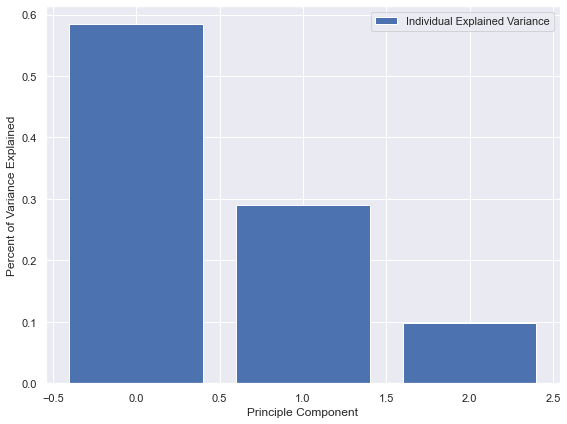

In [454]:
explained_variance=pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))

plt.bar(range(explained_variance.shape[0]), explained_variance,label='Individual Explained Variance', align='center')
plt.ylabel('Percent of Variance Explained')
plt.xlabel('Principle Component')
plt.legend(loc='best')
plt.tight_layout()

We drop the 4 old features, keep the 3 new PCA components instead.

In [455]:
df.drop(columns = features, inplace = True)

In [456]:
for i in range(3):
    df["pca_"+str(i)] = x[:,i]

Let's take a look at the heatmap now!

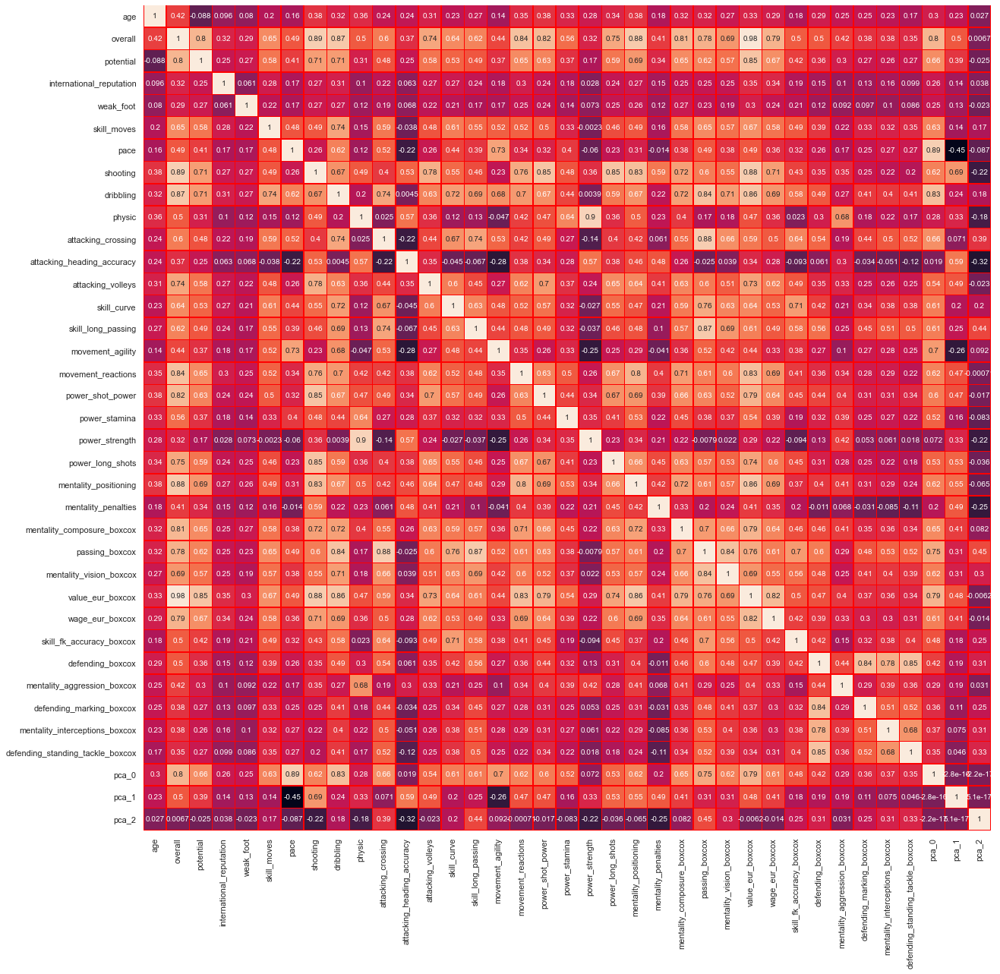

In [457]:
plt.figure(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, linecolor = "red", linewidths = 0.5, cbar = False);

The last component doesn't really do anything. Let's drop it.

In [458]:
df.drop(columns = ['pca_2'], inplace = True)

**Categorical Variables**

First of all, let's select them.

In [459]:
pd.DataFrame(list(df.select_dtypes('object').columns))

,0
0,position1
1,position2
2,nationality
3,club
4,preferred_foot
5,work_rate


Let's check the number of players for each category.

Nationality and clubs are definitely important. But there are simply way too many categories. Having faith in our numeric features, let's drop them.

In [460]:
df.drop(columns = ['nationality','club'], inplace = True)

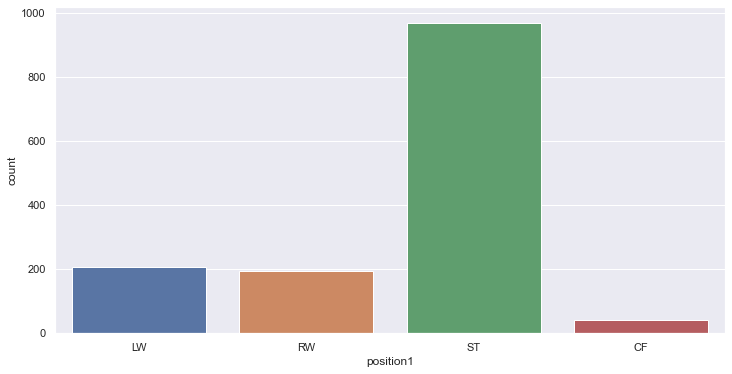

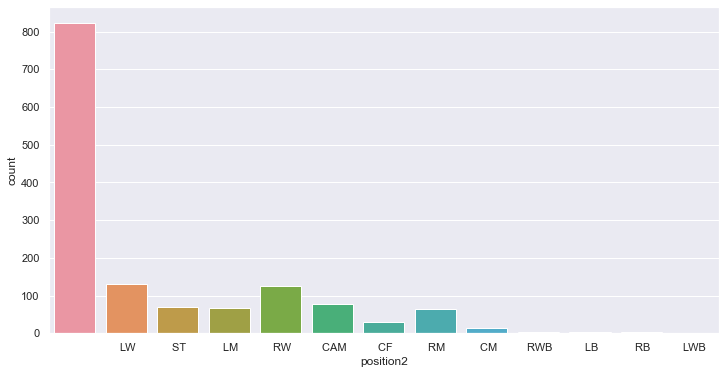

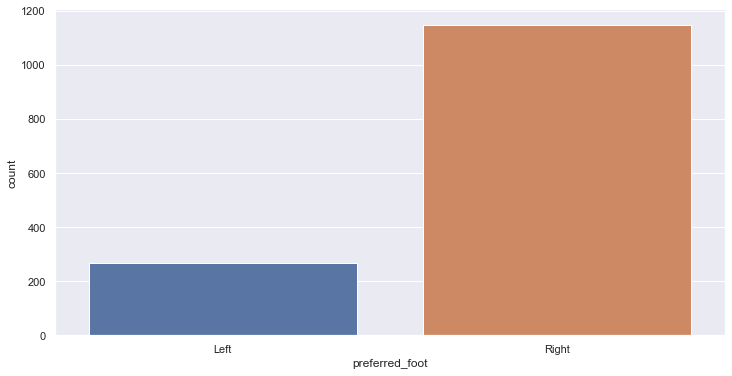

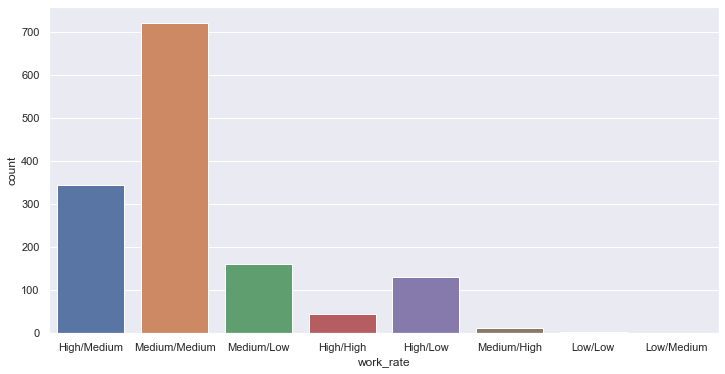

In [461]:
features = ['position1', 'position2','preferred_foot', 'work_rate']

for feat in features:
    f, ax = plt.subplots(figsize=(12, 6))
    sns.countplot(x=feat, data=df)
    plt.show()

Player without 2nd choice as an attacking position should have a NA position.

In [462]:
df['position2'] = df['position2'].map(lambda pos: "" if pos not in [' RW', ' LW', ' CF', ' ST'] else pos )

In [463]:
df['position2'] = df['position2'].map(lambda pos: "NA" if pos  in [""] else pos )

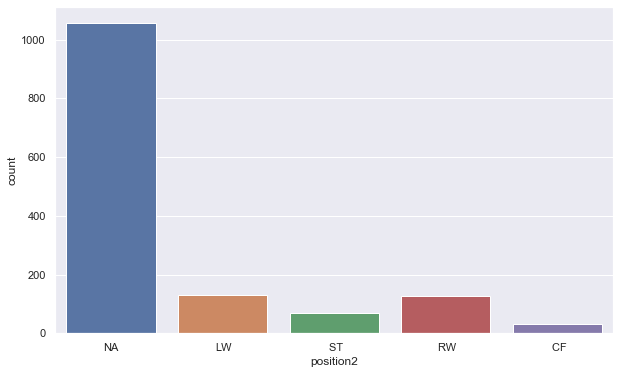

In [464]:
f, ax = plt.subplots(figsize=(10, 6))
sns.countplot(x='position2', data=df)
plt.show()

The work rate consists of OFFENSIVE/DEFENSIVE. We're working with attacking players. Let's merge it likewise.

In [465]:
df['work_rate'] = df['work_rate'].map(lambda rate: "High" if rate in ['High/Medium', 'High/High', 'High/Low'] else rate )
df['work_rate'] = df['work_rate'].map(lambda rate: "Medium" if rate in ['Medium/High', 'Medium/Medium', 'Medium/Low'] else rate )
df['work_rate'] = df['work_rate'].map(lambda rate: "Low" if rate in ['Low/High', 'Low/Medium', 'Low/Low'] else rate )

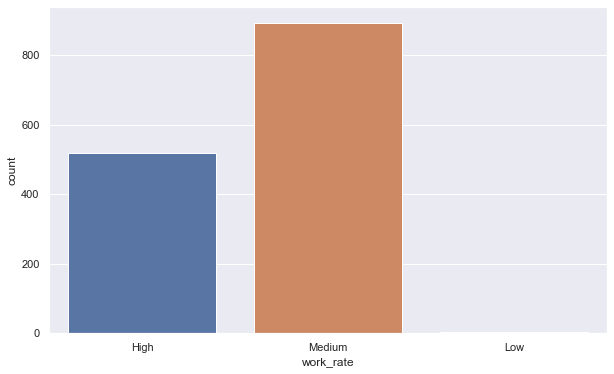

In [466]:
f, ax = plt.subplots(figsize=(10, 6))
sns.countplot(x='work_rate', data=df)
plt.show()

Okay. Let's replace low with medium and give them numeric values.

In [467]:
df['work_rate'] = df['work_rate'].map(lambda rate: 2 if rate in ['High'] else rate )
df['work_rate'] = df['work_rate'].map(lambda rate: 1 if rate in ['Medium'] else rate )
df['work_rate'] = df['work_rate'].map(lambda rate: 1 if rate in ['Low'] else rate )

I'm kind of interested in seeing how the preferred foot, position (particularly LW/RW) and overall relate.

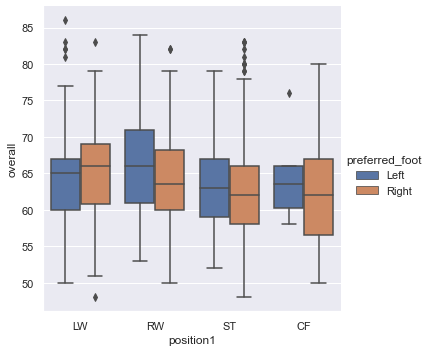

In [468]:
sns.catplot(x="position1", y="overall", hue="preferred_foot", kind="box", data=df);

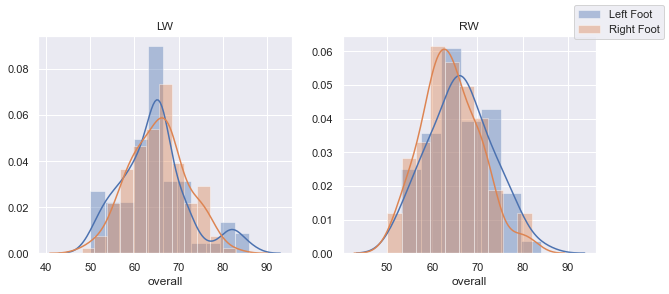

In [469]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (10,4))

sns.distplot(df[ ((df["position1"] == "LW")&(df["preferred_foot"] =="Left")) ]['overall'] ,label= 'Left Foot', ax = ax1);
sns.distplot(df[ ((df["position1"] == "LW")&(df["preferred_foot"] =="Right")) ]['overall'], label = 'Right Foot', ax = ax1 );

sns.distplot(df[ ((df["position1"] == "RW")&(df["preferred_foot"] =="Left")) ]['overall'],  ax = ax2);
sns.distplot(df[ ((df["position1"] == "RW")&(df["preferred_foot"] =="Right")) ]['overall'],  ax = ax2 );

ax1.set_title("LW")
ax2.set_title("RW")

f.legend()
plt.show()

Interesting. Left/Right foot definitely separates RW somewhat. But LW?

Time to encode categorical features.

In [470]:
df = pd.get_dummies(df)
df = df.astype('float64')

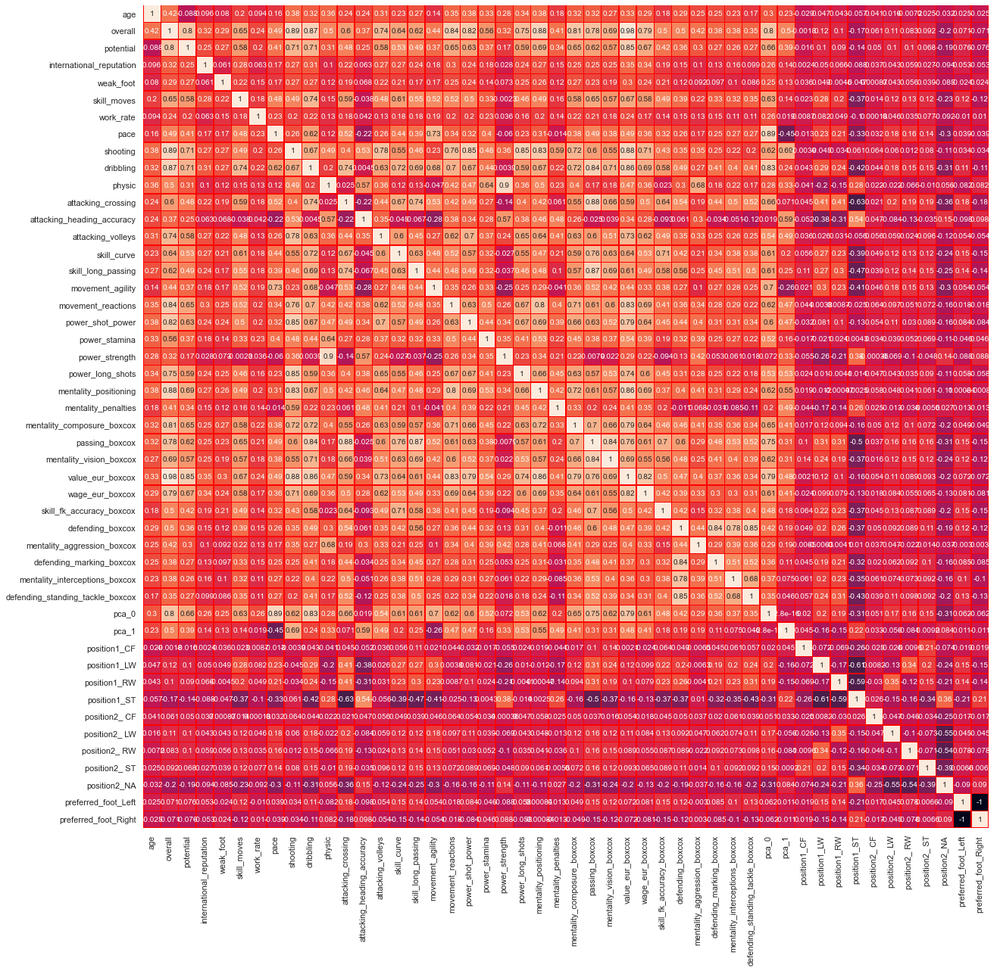

In [471]:
plt.figure(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, linecolor = "red", linewidths = 0.5, cbar = False);

Let's see the interaction between these features.

In [472]:
poly_transformer = PolynomialFeatures(degree = 2, interaction_only = True)

In [473]:
categorical_features = ['position1_CF','position1_LW','position1_RW','position1_ST',\
            'position2_ CF', 'position2_ LW', 'position2_ RW', 'position2_ ST', 'position2_NA',\
             'preferred_foot_Left', 'preferred_foot_Right']

In [474]:
x = df.loc[:,categorical_features]

poly_transformer.fit(x)
poly_features = poly_transformer.transform(x)

In [475]:
dfcatinteraction = pd.DataFrame(poly_features, columns = poly_transformer.get_feature_names(input_features = categorical_features))

In [477]:
dfcatinteraction['overall'] = df['overall'].values

In [478]:
dfcatinteraction

,1,position1_CF,position1_LW,position1_RW,position1_ST,position2_ CF,position2_ LW,position2_ RW,position2_ ST,position2_NA,preferred_foot_Left,preferred_foot_Right,position1_CF position1_LW,position1_CF position1_RW,position1_CF position1_ST,position1_CF position2_ CF,position1_CF position2_ LW,position1_CF position2_ RW,position1_CF position2_ ST,position1_CF position2_NA,position1_CF preferred_foot_Left,position1_CF preferred_foot_Right,position1_LW position1_RW,position1_LW position1_ST,position1_LW position2_ CF,position1_LW position2_ LW,position1_LW position2_ RW,position1_LW position2_ ST,position1_LW position2_NA,position1_LW preferred_foot_Left,position1_LW preferred_foot_Right,position1_RW position1_ST,position1_RW position2_ CF,position1_RW position2_ LW,position1_RW position2_ RW,position1_RW position2_ ST,position1_RW position2_NA,position1_RW preferred_foot_Left,position1_RW preferred_foot_Right,position1_ST position2_ CF,position1_ST position2_ LW,position1_ST position2_ RW,position1_ST position2_ ST,position1_ST position2_NA,position1_ST preferred_foot_Left,position1_ST preferred_foot_Right,position2_ CF position2_ LW,position2_ CF position2_ RW,position2_ CF position2_ ST,position2_ CF position2_NA,position2_ CF preferred_foot_Left,position2_ CF preferred_foot_Right,position2_ LW position2_ RW,position2_ LW position2_ ST,position2_ LW position2_NA,position2_ LW preferred_foot_Left,position2_ LW preferred_foot_Right,position2_ RW position2_ ST,position2_ RW position2_NA,position2_ RW preferred_foot_Left,position2_ RW preferred_foot_Right,position2_ ST position2_NA,position2_ ST preferred_foot_Left,position2_ ST preferred_foot_Right,position2_NA preferred_foot_Left,position2_NA preferred_foot_Right,preferred_foot_Left preferred_foot_Right,overall
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,86.0
1,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,83.0
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,83.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,83.0
5,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,83.0
6,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,83.0
7,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,82.0
8,1.0,0

In [481]:
corrdf = pd.DataFrame(columns=['Feature', 'PearsonR_Correlation', 'P_Value'])

cols = list(dfcatinteraction.select_dtypes('float64').columns)

for col in cols:
    pearson_coeff, p_value = stats.pearsonr(dfcatinteraction['overall'], dfcatinteraction[col])
    corrdf.loc[len(corrdf)] = [col, pearson_coeff, p_value]

In [482]:
corrdf.sort_values('PearsonR_Correlation', ascending=False)

,Feature,PearsonR_Correlation,P_Value
67,overall,1.000000,0.000000e+00
33,position1_RW position2_ LW,0.125588,2.150316e-06
2,position1_LW,0.119975,6.027945e-06
26,position1_LW position2_ RW,0.119574,6.477696e-06
6,position2_ LW,0.114387,1.609103e-05
30,position1_LW preferred_foot_Right,0.108594,4.250360e-05
37,position1_RW preferred_foot_Left,0.100621,1.498783e-04
3,position1_RW,0.100473,1.532890e-04
56,position2_ LW preferred_foot_Right,0.096615,2.730575e-04
8,position2_ ST,0.091942,5.345894e-04


Here's the interaction categorical features worth keeping.

In [483]:
interactionfeatures = ['position1_RW position2_ LW', 'position1_LW', 'position1_LW position2_ RW', 'position2_ LW',\
                       'position1_LW preferred_foot_Right', 'position1_RW preferred_foot_Left', 'position1_RW',\
                        'position2_ LW preferred_foot_Right', 'position2_ ST', 'position1_ST preferred_foot_Right',\
                        'position1_ST', 'position1_ST position2_NA', 'position2_NA preferred_foot_Right', 'position2_NA' ]

In [485]:
dfcatinteraction = dfcatinteraction.filter(interactionfeatures)

In [486]:
dfcatinteraction['overall'] = df['overall'].values

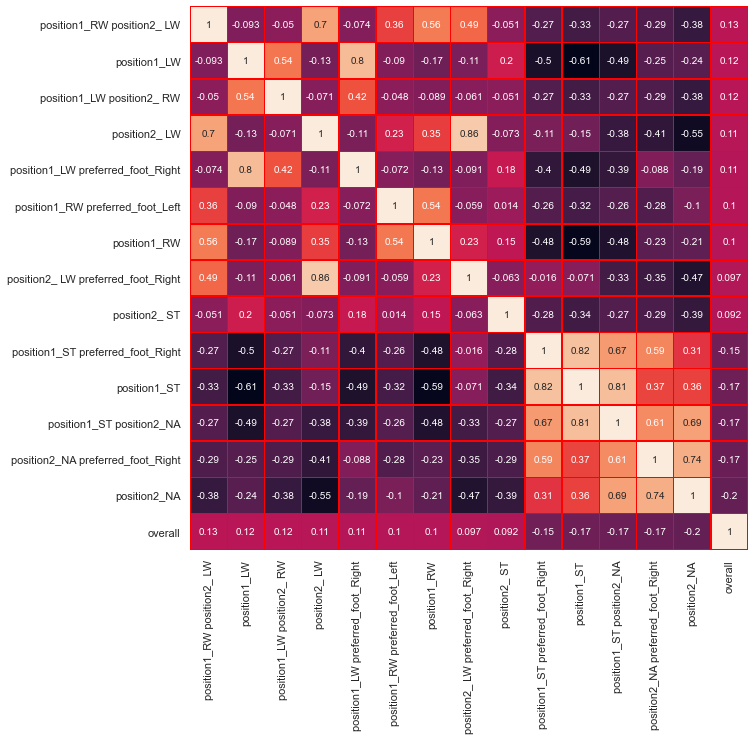

In [489]:
plt.figure(figsize = (10,10))
sns.heatmap(dfcatinteraction.corr(), annot = True, linecolor = "red", linewidths = 0.5, cbar = False);

In [490]:
dfcatinteraction.drop(columns=['overall'], inplace = True)

In [491]:
df.drop(columns = categorical_features, inplace = True)

In [493]:
for feature in interactionfeatures:
    df[feature] = dfcatinteraction[feature].values

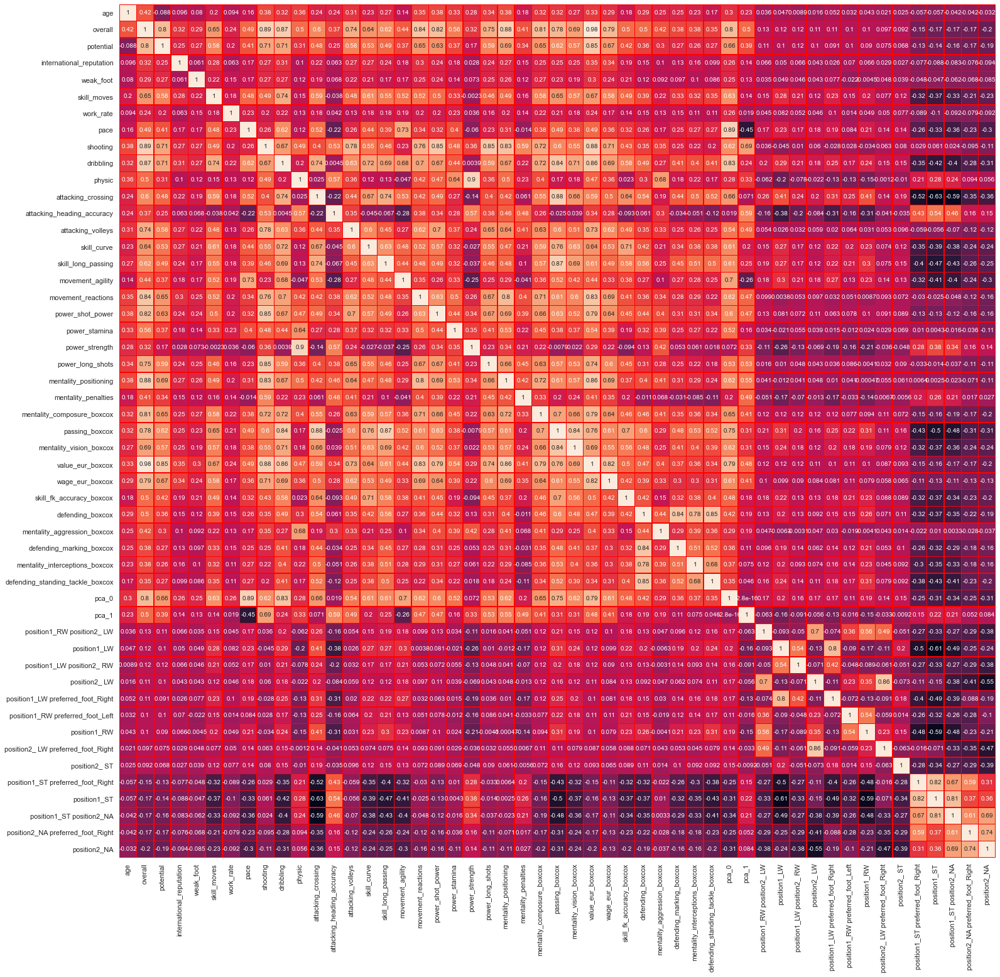

In [495]:
plt.figure(figsize = (25,25))
sns.heatmap(df.corr(), annot = True, linecolor = "red", linewidths = 0.5, cbar = False);

Whoah. That's a lot of features. It's time to finally work on them!

It was well worth going through all of this trouble though. We sure do have **much** cleaner data than before. Modeling should be a breeze!

Finally, let's export our dataframe to a csv.

**Exporting**

In [498]:
df.to_csv(r'C:\Users\AVI\Desktop\fifa-20\data\attackingRegressionFIFA20data.csv', index = False)